In [1]:
library(ggplot2)
library(reshape2)
library(gridExtra)
library(factoextra)
library(FactoMineR)
library(plotly)
library(ggmap)

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa


Attachement du package : ‘plotly’


L'objet suivant est masqué depuis ‘package:ggplot2’:

    last_plot


L'objet suivant est masqué depuis ‘package:stats’:

    filter


L'objet suivant est masqué depuis ‘package:graphics’:

    layout


ℹ Google's Terms of Service: <https://mapsplatform.google.com>
  Stadia Maps' Terms of Service: <https://stadiamaps.com/terms-of-service/>
  OpenStreetMap's Tile Usage Policy: <https://operations.osmfoundation.org/policies/tiles/>
ℹ Please cite ggmap if you use it! Use `citation("ggmap")` for details.

Attachement du package : ‘ggmap’


L'objet suivant est masqué depuis ‘package:plotly’:

    wind




## Data

In [2]:
load <- read.csv("data/velibLoading.csv", sep=" ") # Reading data of the Velib loading
head(load)


,Lun.00,Lun.01,Lun.02,Lun.03,Lun.04,Lun.05,Lun.06,Lun.07,Lun.08,Lun.09,⋯,Dim.14,Dim.15,Dim.16,Dim.17,Dim.18,Dim.19,Dim.20,Dim.21,Dim.22,Dim.23
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.03846154,0.03846154,0.07692308,0.03846154,0.03846154,0.03846154,0.03846154,0.03846154,0.10714286,0.00000000,⋯,0.29629630,0.11111111,0.1111111,0.14814815,0.30769231,0.07692308,0.11538462,0.07692308,0.1538462,0.1538462
2,0.47826087,0.47826087,0.47826087,0.43478261,0.43478261,0.43478261,0.43478261,0.43478261,0.26086957,0.04347826,⋯,0.04347826,0.00000000,0.2173913,0.13043478,0.04545455,0.17391304,0.17391304,0.17391304,0.2608696,0.3913043
3,0.21818182,0.14545455,0.12727273,0.10909091,0.10909091,0.10909091,0.09090909,0.09090909,0.05454545,0.10909091,⋯,0.25925926,0.25925926,0.2037037,0.12962963,0.14814815,0.29629630,0.31481481,0.37037037,0.3703704,0.4074074
4,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,1.00000000,1.00000000,1.00000000,⋯,1.00000000,1.00000000,0.9047619,0.85714286,0.85714286,0.85714286,0.76190476,0.76190476,0.7619048,0.7619048
5,0.92753623,0.81159420,0.73913043,0.72463768,0.72463768,0.72463768,0.72463768,0.72463768,0.75362319,0.97101449,⋯,0.22727273,0.45454545,0.5909091,0.83333333,1.00000000,0.81818182,0.63636364,0.71212121,0.6212121,0.5757576
6,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.08333333,0.00000000,⋯,0.34782609,0.08695652,0.1153846,0.08695652,0.13043478,0.08695652,0.08695652,0.43478261,0.3913043,0.5217391


In [3]:
coord = read.csv('data/velibCoord.csv', sep = " ") # Reading coordinates for each loading
head(coord)

,longitude,latitude,bonus,names
,<dbl>,<dbl>,<int>,<chr>
1,2.377389,48.88630,0,EURYALE DEHAYNIN
2,2.317591,48.89002,0,LEMERCIER
3,2.330447,48.85030,0,MEZIERES RENNES
4,2.271396,48.83373,0,FARMAN
5,2.366897,48.84589,0,QUAI DE LA RAPEE
6,2.363335,48.82191,0,CHOISY POINT D'IVRY


### Data cleaning

In [4]:
cat('Shape of "load" :', dim(load))
number_of_missing_values_load <- sum(is.na(load))
number_of_duplicate_values_load <- sum(duplicated(load))
cat('\nNumber of missing values "load"', number_of_missing_values_load)
cat('\nNumber of duplicate values "load":', number_of_duplicate_values_load,"\n")

cat('\nShape of "coord" :', dim(coord))
number_of_missing_values_coord <- sum(is.na(coord))
number_of_duplicate_values_coord <- sum(duplicated(coord))
cat('\nNumber of missing values "coord"', number_of_missing_values_coord)
cat('\nNumber of duplicate values "coord":', number_of_duplicate_values_coord)


Shape of "load" : 1189 168
Number of missing values "load" 0
Number of duplicate values "load": 0 

Shape of "coord" : 1189 4
Number of missing values "coord" 0
Number of duplicate values "coord": 0

## Descriptive part

In [5]:
station_names <- table(coord$names)
station_names <- sort(station_names,decreasing=TRUE)
head(station_names)
indexes <- which(station_names>1)
print(station_names[indexes])
cat("\nNumber of stations with multiple occurences in coord:", length(station_names[indexes]))


 GARE D'AUSTERLITZ    PORTE DES LILAS    ALEXANDRE DUMAS            AQUEDUC 
                 3                  3                  2                  2 
          BASTILLE         BELLEVILLE 
                 2                  2 


     GARE D'AUSTERLITZ        PORTE DES LILAS        ALEXANDRE DUMAS 
                     3                      3                      2 
               AQUEDUC               BASTILLE             BELLEVILLE 
                     2                      2                      2 
     BOURSE DU TRAVAIL               BROCHANT           CHERCHE MIDI 
                     2                      2                      2 
                CLICHY                   DODU  FAURE (AUBERVILLIERS) 
                     2                      2                      2 
    FRANCE (LEVALLOIS)          GARE DE L'EST               JOURDAIN 
                     2                      2                      2 
              LACEPEDE               LEGENDRE     PARC DE BELLEVILLE 
                     2                      2                      2 
            PORT ROYAL      PORTE DE BAGNOLET    PORTE DE SAINT OUEN 
                     2                      2                      2 
        RICHARD LEN

In [6]:
name_checkup <- c(' PORTE DES LILAS', ' CLICHY')
multiple_stat <- coord$names %in% name_checkup
stat_rel <- coord[multiple_stat,]
print(stat_rel)

    longitude latitude bonus            names
29   2.328807 48.88413     0           CLICHY
362  2.404770 48.87660     1  PORTE DES LILAS
450  2.405960 48.87541     1  PORTE DES LILAS
500  2.326207 48.88332     0           CLICHY
957  2.411046 48.87810     1  PORTE DES LILAS


ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ 72 tiles needed, this may take a while (try a smaller zoom?)



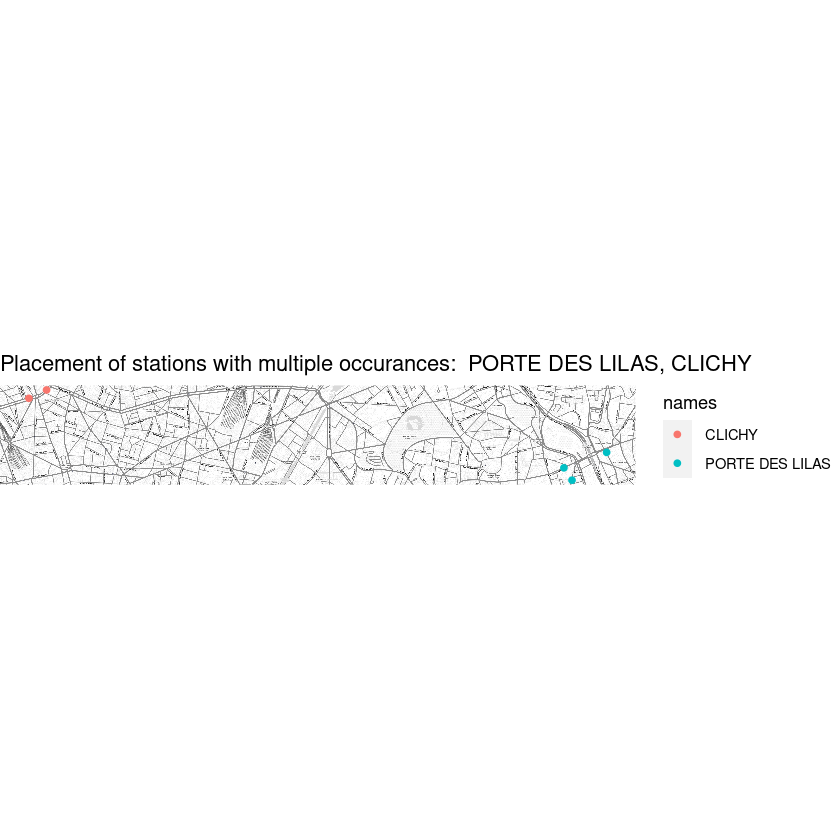

In [7]:
fig <- qmplot(data=stat_rel, longitude, latitude, color = names, zoom = 16) + 
    labs(title = paste('Placement of stations with multiple occurances:',paste(name_checkup, collapse = ',')))
fig

Looking at two different stations with multiple occurences, we can see that they are really close geographically. We can suppose that the velib there are often used. Let's take a look at the loading of the station Porte des lilas .


No id variables; using all as measure variables

No id variables; using all as measure variables

No id variables; using all as measure variables



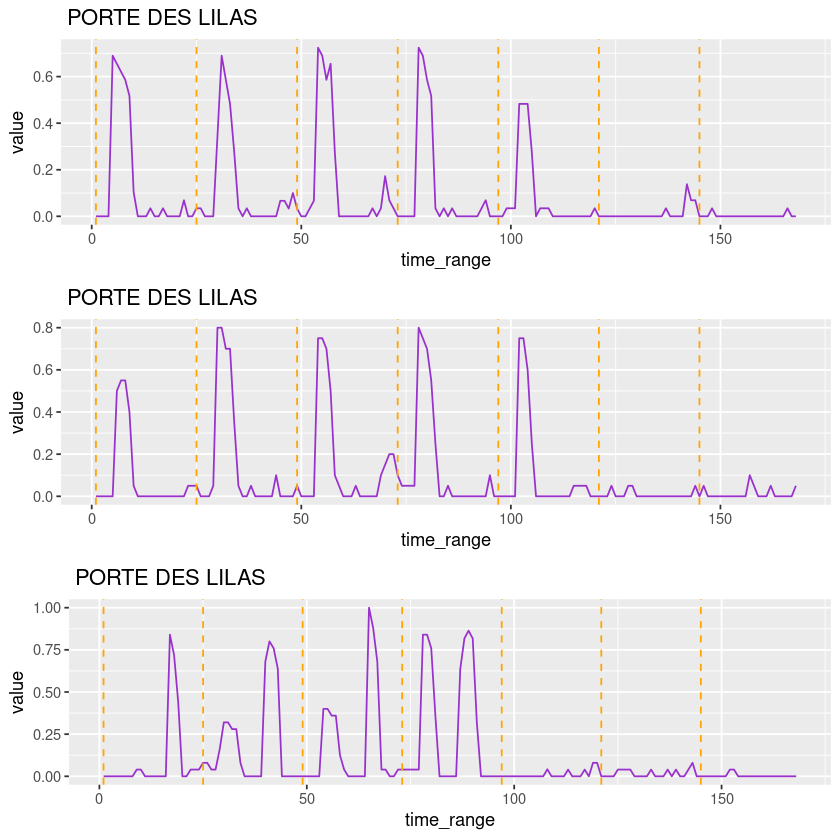

In [8]:
time_tick = 1 + 24*(0:6) 

ind <- which(coord$names == " PORTE DES LILAS")
i1 <- ind[1]

df = melt(load[i1,])  
df$time_range = 1:ncol(load)

p1 = ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(title=coord$names[i1])

i2 <- ind[2]
df = melt(load[i2,])
df$time_range = 1:ncol(load)

p2 = ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(title=coord$names[i2])

i3 <- ind[3]

df = melt(load[i3,]) 
df$time_range = 1:ncol(load)

p3 = ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(title=coord$names[i3])

p <- list(p1,p2,p3)
do.call(grid.arrange,p)

Indeed, we can clearly see that the loading of those station are often near 0. It moves a lot so we can imagine that the velib are put there the morning and directly used by the inhabitants to go to work. We can explain that there is only one time in the day where the loading is high by the fact that this station is on a hill. We can suppose that the people are using the velib to go down to work and then take the public transport to go back up. Let's take a look at the loading of the station Clichy which is not on a hill.


No id variables; using all as measure variables

No id variables; using all as measure variables



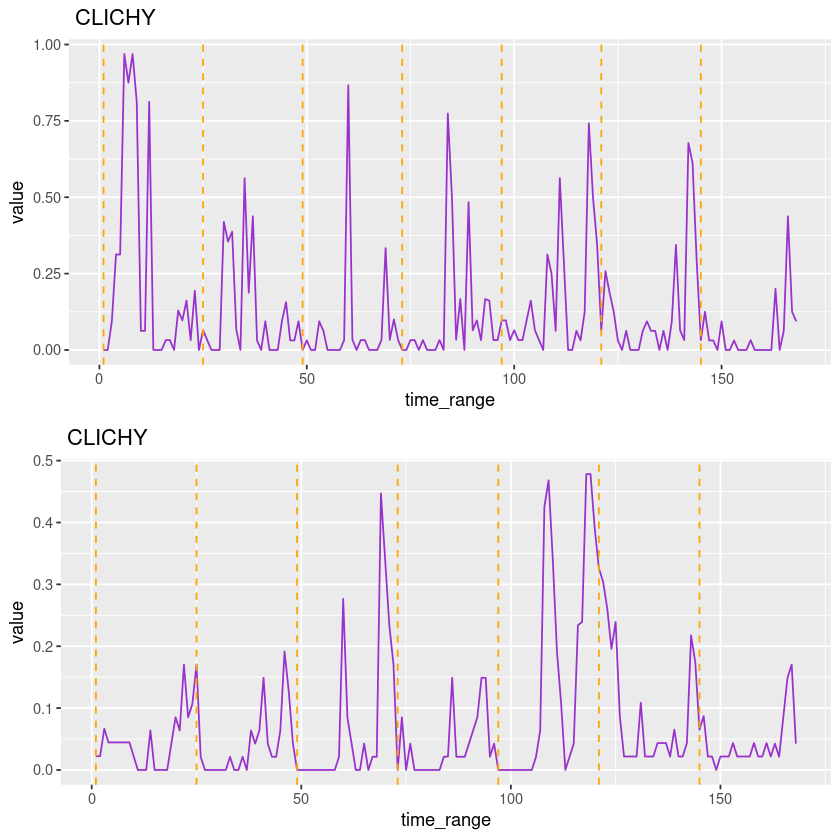

In [9]:
ind <- which(coord$names == " CLICHY")
i1 <- ind[1]

df = melt(load[i1,])  
df$time_range = 1:ncol(load)

p1 = ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
     labs(title=coord$names[i1])

i2 <- ind[2]
df = melt(load[i2,])
df$time_range = 1:ncol(load)

p2 = ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
     labs(title=coord$names[i2])


p <- list(p1,p2)
do.call(grid.arrange,p)

It is really more difficult to interpret the loading of this station.


In [10]:
print('--- Average loading ---')
mean <- rowMeans(load) # Average per station
tot_mean <- mean(mean)
print(round(tot_mean,4))

# --- #
print(" ")
print('--- Least loaded station, on average ---')
print(paste(coord[which.min(mean),],round (min(mean),4)))
# --- 

print('')

print('--- Fullest loaded station, on average ---')
print(paste(coord[which.max(mean),],round (max(mean),4)))

# --- 
print("--- Average loading of station CLICHY ---")
print((mean[i1]+mean[i2])/2)


[1] "--- Average loading ---"
[1] 0.3816
[1] " "
[1] "--- Least loaded station, on average ---"
[1] "2.42793357977893 0.0161"   "48.8739292000335 0.0161"  
[3] "1 0.0161"                  " HORNET (BAGNOLET) 0.0161"
[1] ""
[1] "--- Fullest loaded station, on average ---"
[1] "2.39826154064032 0.9194"              
[2] "48.814660082168 0.9194"               
[3] "0 0.9194"                             
[4] " INSURRECTION AOUT 1944 (IVRY) 0.9194"
[1] "--- Average loading of station CLICHY ---"
        29 
0.09970553 


The average loading of the stations Clichy is clearly lower than the average loading of all the stations. The velib there are then often used. It explains the fact that there is two stations at the same place there. However, we can see that the station Hornet (Bagnolet) is often empty but is not part of the station with multiple occurrences. It would maybe be useful to add one more. On the other hand, some stations are not that useful. Indeed, the station Insurrection aout 1944 (Ivry) is almost full at every hour of the day, with an average loading of almost 92%. Let's take a closer look.


No id variables; using all as measure variables



Lowest loading: 0.567

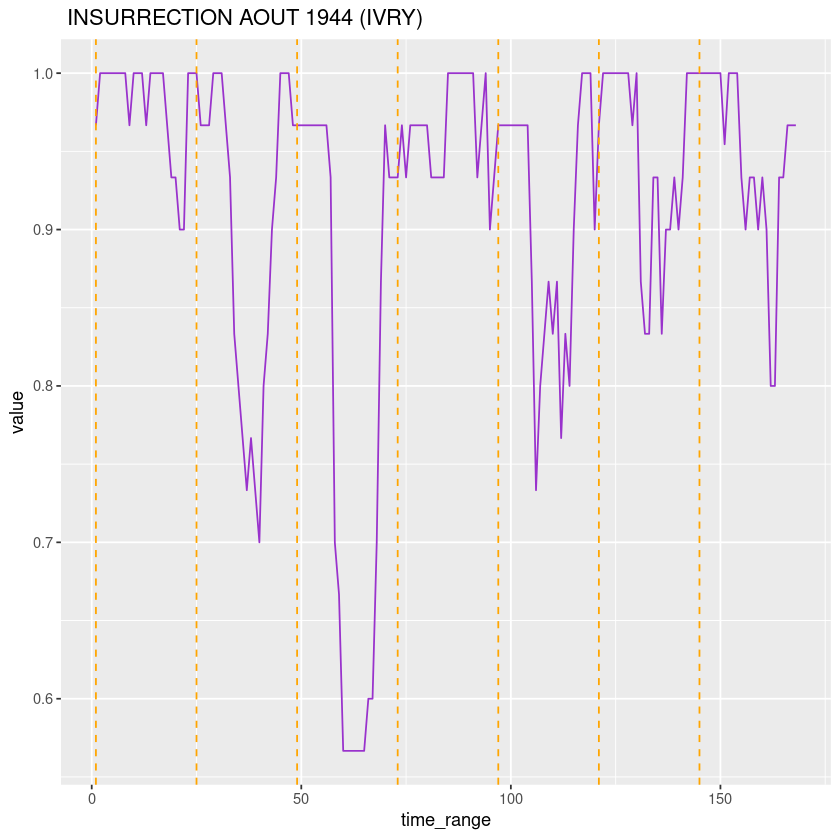

In [11]:
ind <- which(coord$names == " INSURRECTION AOUT 1944 (IVRY)")
i <- ind[1]

df = melt(load[i,])  
df$time_range = 1:ncol(load)

ggplot(df, aes(x=time_range, y=value)) + geom_line(col="darkorchid") +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(title=coord$names[i])

cat("Lowest loading:", round(min(load[i,]), 3))


We can now see that the lower loading is almost of 57% on wednesday but it is hard to explain why. Except that day, it does not go under 70%. Let's now take a look at the entire data frame.


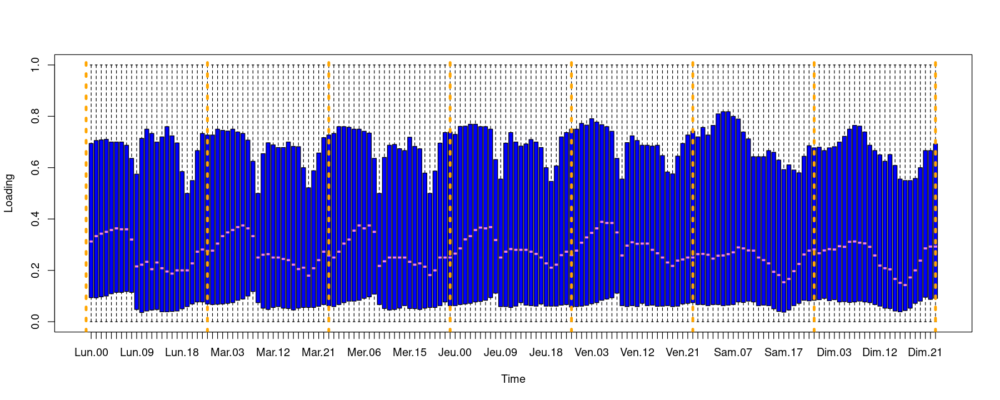

In [12]:
time_ticks <- seq(0,168, by = 24)

options(repr.plot.width = 15, repr.plot.height = 6)
bp <- boxplot(load, xlab = "Time", ylab = "Loading", col = "blue", medcol ="violet")
abline(v = time_ticks, col = "orange", lwd = 4, lty = "dotted")

We can see that the behavior of stations loading is similar every weekday.The median load rate remains between 20% and 40%, so we can deduce that there is an imbalance in the use of the various stations.


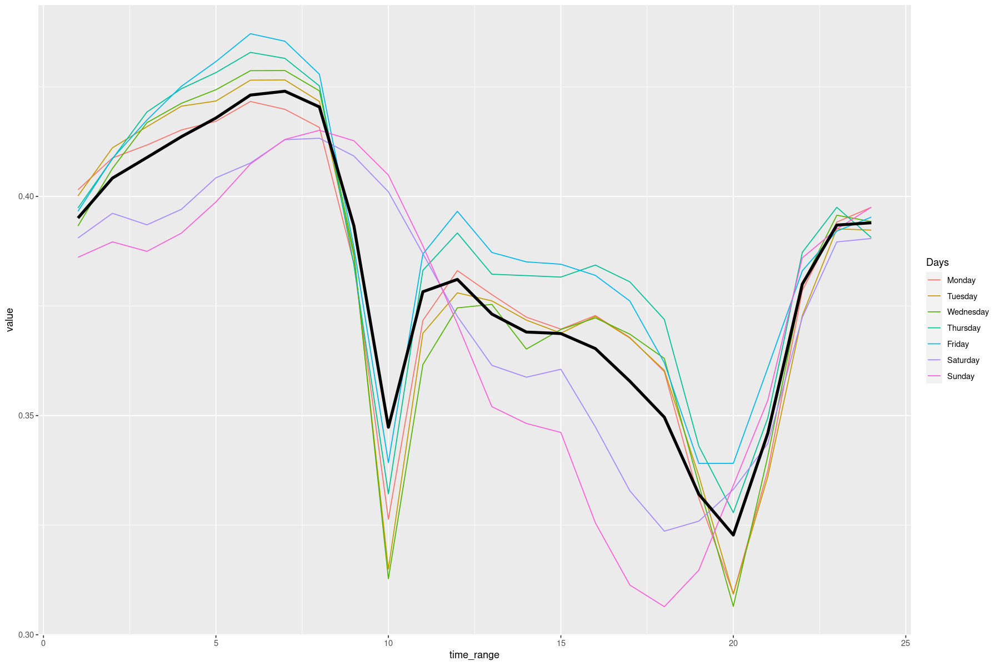

In [13]:
mean_per_hour_per_day = colMeans(load)
mean_per_hour_per_day = matrix(mean_per_hour_per_day, nrow = 24)
mean_per_hour         = rowMeans(mean_per_hour_per_day)

# --- #

mean_per_hour_per_day            = as.data.frame(mean_per_hour_per_day)
colnames(mean_per_hour_per_day)  = list("Monday", "Tuesday", "Wednesday","Thursday", "Friday", "Saturday", "Sunday")
mean_per_hour_per_day$time_range = c(1:24)
mean_per_hour_per_day            = melt(mean_per_hour_per_day, id='time_range', variable.name='Days')

mean_per_hour            = as.data.frame(mean_per_hour)
colnames(mean_per_hour)  = list("Weekly")
mean_per_hour$time_range = c(1:24)

# --- #

options(repr.plot.width = 15, repr.plot.height = 10)

ggplot() + 
    geom_line(data=mean_per_hour_per_day, aes(x=time_range, y=value, color=Days)) + 
    geom_line(data=mean_per_hour, aes(x=time_range, y=Weekly), linewidth = 1.5)

For the weekdays, we can clearly see that the average loading evolves more or less in the same way. The stations are fuller in the morning, then people probably goes to work by bike between 8am and 10am. Many stations must have a really low loading rate at 8pm. In the weekend, the average loading is the lowest around 6pm. The velib are, in average, more used.


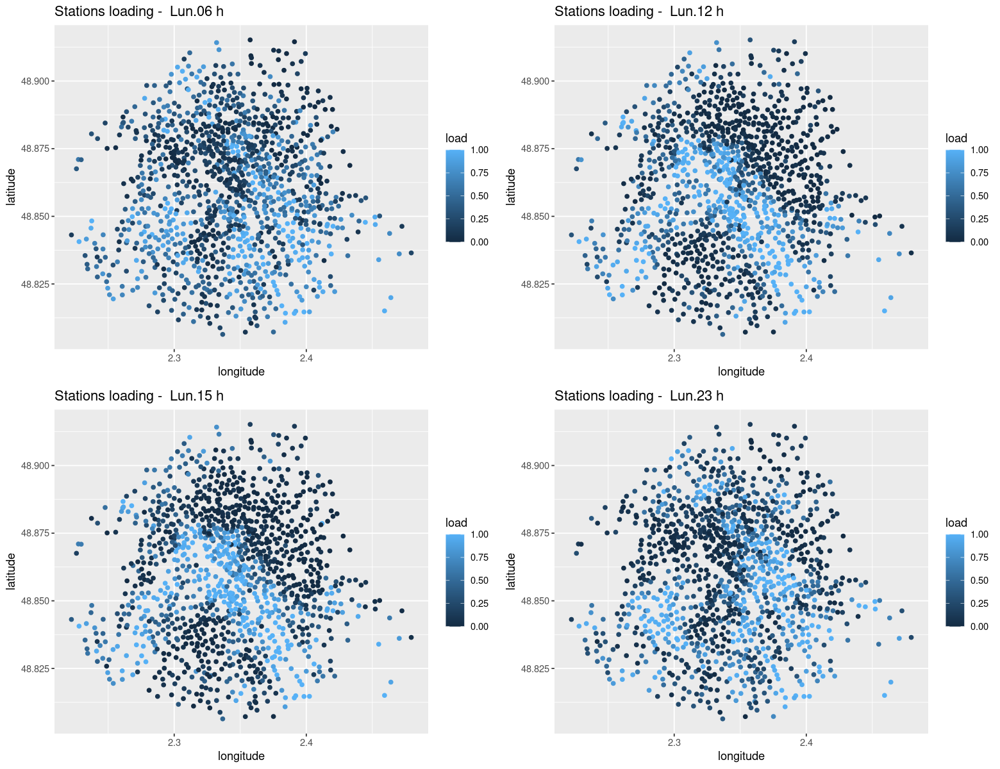

In [14]:
noms_col <- names(load)

options(repr.plot.width = 13, repr.plot.height = 10)
hours = c(6, 12,15, 23)

dfi = coord
p1 = list()
for (i in 1:length(hours)){
    dfi$load = load[,hours[i]+1]
    p1[[i]] = ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - ",noms_col[hours[i]+1],"h"))
}

do.call(grid.arrange,c(p1, ncol=2))


We can see that early in the morning et late in the evening, the stations the busiest stations are all around Paris center. However, during the day, they are all along the Seine. We can imagine that people are taking velib to go to work and go back home. Moreover, when we took a look at the map of the cycle paths of Paris, we can see that most of them are along the Seine. We can suppose that people prefer to ride a bike on a cycle path and then leave the bike when the path stops to finish their routes by walk or public transport.


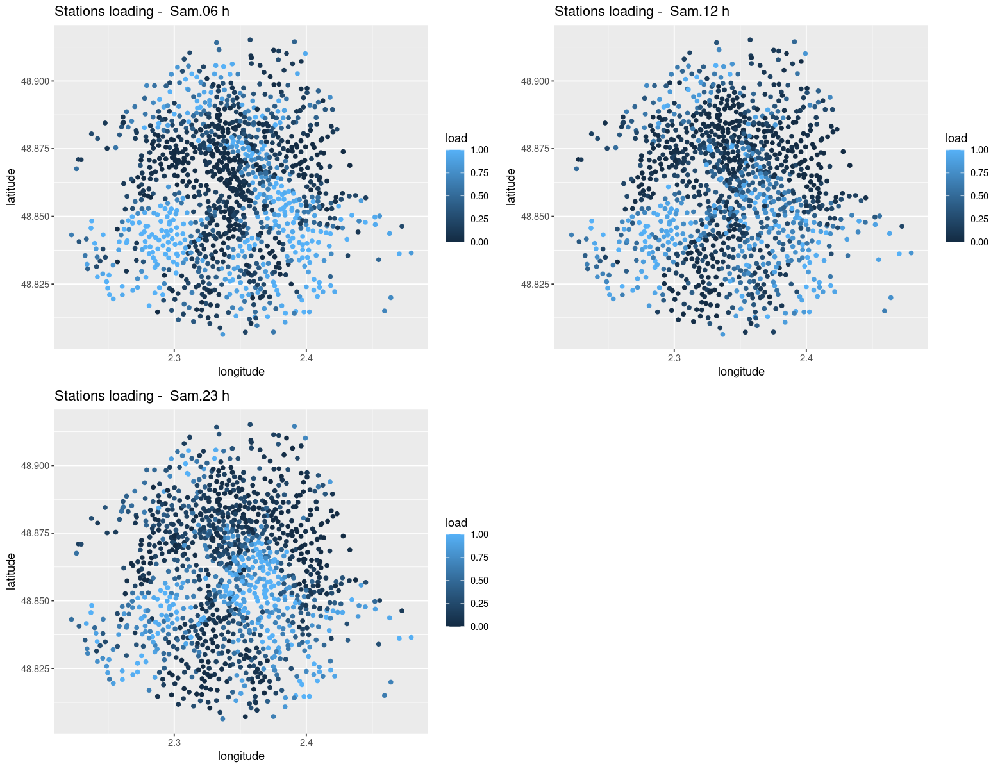

In [15]:
options(repr.plot.width = 13, repr.plot.height = 10)
hours = c(126, 132, 143)

dfi = coord
p1 = list()
for (i in 1:length(hours)){
    dfi$load = load[,hours[i]+1]
    p1[[i]] = ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - ",noms_col[hours[i]+1],"h"))
}

do.call(grid.arrange,c(p1, ncol=2))

For the weekend, here the saturday, we can see that the velibs are globally more used. However, we can imagine that people are not going far from their place because the busiest stations stay the same more or less throughout the day. The stations are even busier at 6am, we can deduce that people are not going outside that early in the weekend.


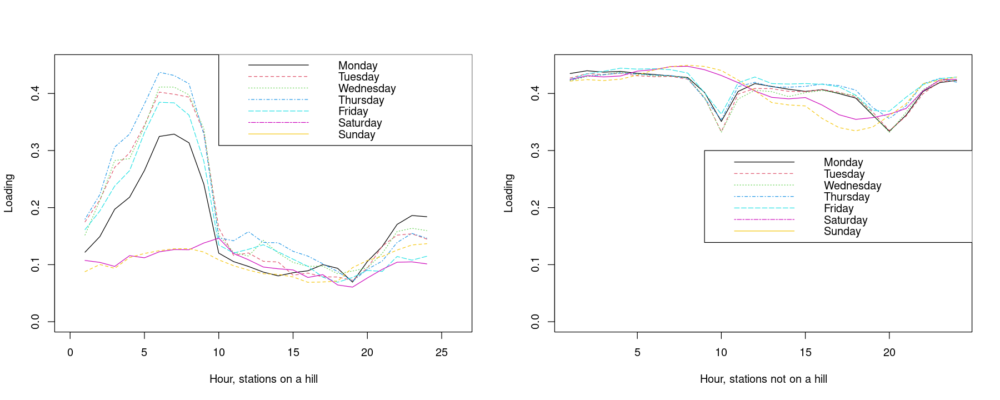

In [16]:
Hill <- load[coord$bonus == 1, ]
NoHill <- load[coord$bonus == 0, ]
options(repr.plot.width = 15, repr.plot.height = 6)


day <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday")
HourHill <- matrix(colMeans(Hill), nrow = 24) # average loading of a station on the hill per hour for one day
HourNoHill <- matrix(colMeans(NoHill), nrow = 24) # average loading of a station not on the hill per hour for one day
options(repr.plot.width = 15, repr.plot.height = 6)
par(mfrow = c(1, 2))
matplot(HourHill, type = "l", xlim = c(0,26), ylim = c(0, 0.45), col = 1:7, pch = 19, 
        xlab = "Hour, stations on a hill", ylab = "Loading")
legend(x = 10, y = 0.47, day,lty = 1:7, col = 1:7)
matplot(HourNoHill, type = "l", ylim = c(0, 0.45), col = 1:7, pch = 19, 
        xlab = "Hour, stations not on a hill", ylab = "Loading")
legend(x = 9, y = 0.3, day, lty = 1:7, col = 1:7)


When we compare the stations that are located on a hill and those that are not on a hill, we can see a clear difference of the loading. During the weekdays, the loading of the stations of a hill is really low (between 0 et 20 %). People must use the bikes to go down to work and take the public transports to go back up, as we said earlier. During the weekend, those stations are always almost empty. However, for the stations that are not on a hill, the average loading per hour is higher (between 30 et 50%) and stays always in same range. 

## PCA



,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,66.888963,39.814859,39.81486
comp 2,39.486446,23.503837,63.31870
comp 3,8.867649,5.278363,68.59706
comp 4,7.305326,4.348408,72.94547
comp 5,5.503113,3.275662,76.22113
comp 6,3.245742,1.931989,78.15312


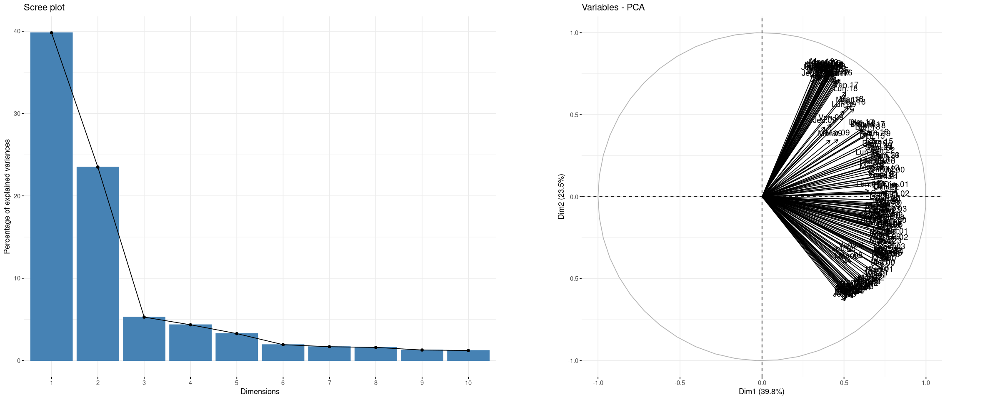

In [17]:
options(repr.plot.width = 20, repr.plot.height = 8)
pca = PCA(load, scale.unit = TRUE,ncp =20, graph=FALSE)

# Visualisation of explained variance and variables
grid.arrange(fviz_eig(pca),fviz_pca_var(pca,axes=c(1,2)),ncol=2)

head(pca$eig)


We chose to keep four components so it explains enough the variances (72.9%) but not more to limit the number of components since it does not make us win a lot of explained variances.


In [18]:
pca<-PCA(load, scale.unit = T, ncp = 4, graph = F)

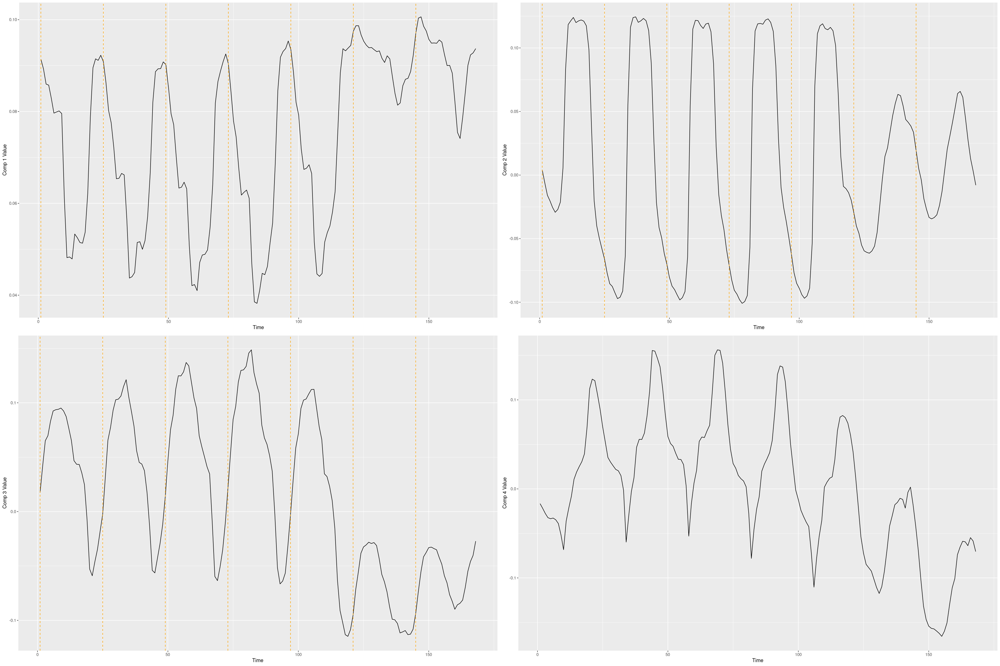

In [19]:
options(repr.plot.width = 30, repr.plot.height = 20)

df = as.data.frame(pca$svd$V)

df$time_range <- 1:ncol(load)

df <- reshape2::melt(df, id.vars = "time_range")


p1 = ggplot(df[df$variable == paste0("V", 1), ], aes(x=time_range, y= value)) + geom_line() +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(x = "Time", y = paste("Comp", 1, "Value"))

p2 = ggplot(df[df$variable == paste0("V", 2), ], aes(x=time_range, y= value)) + geom_line() +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(x = "Time", y = paste("Comp", 2, "Value"))

p3 = ggplot(df[df$variable == paste0("V", 3), ], aes(x=time_range, y= value)) + geom_line() +
    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
    labs(x = "Time", y = paste("Comp", 3, "Value"))

p4 = ggplot(df[df$variable == paste0("V", 4), ], aes(x=time_range, y= value)) + geom_line()  +
     labs(x = "Time", y = paste("Comp", 4, "Value"))

#p5 = ggplot(df[df$variable == paste0("V", 5), ], aes(x=time_range, y= value)) + geom_line() +
#    geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
#    labs(x = "Time", y = paste("Comp", 5, "Value"))



p <- list(p1,p2,p3,p4)
do.call(grid.arrange,p)


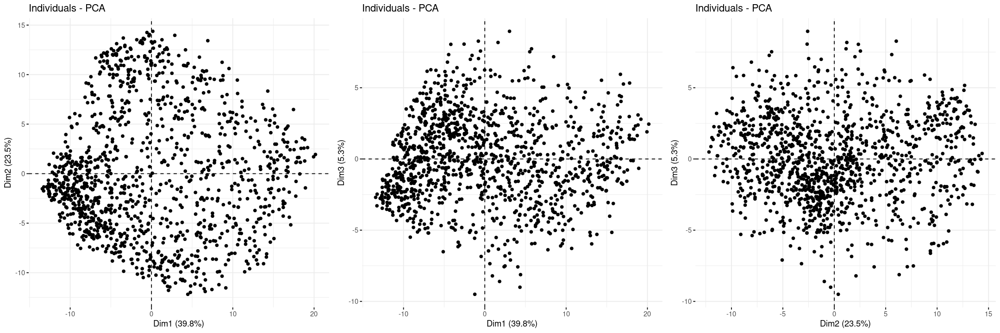

In [20]:
options(repr.plot.width = 18, repr.plot.height = 6)

grid.arrange(
  
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point")),
    fviz_pca_ind(pca, axes=c(1,3), geom=c("point")),
    fviz_pca_ind(pca, axes=c(2,3), geom=c("point")),
    ncol=3
)

## Clustering the initial data

### Kmeans

#### Choice of the best K:

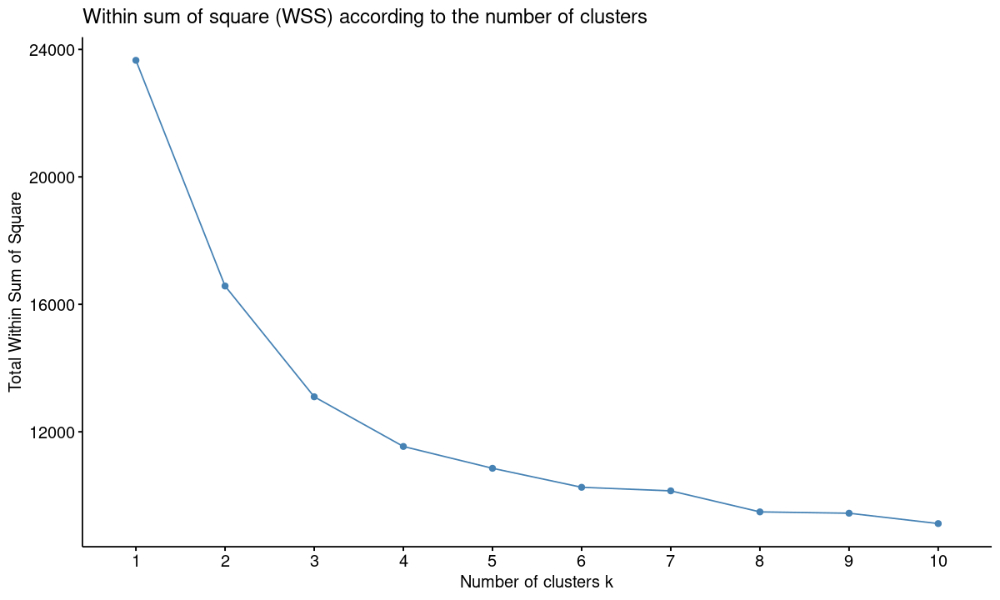

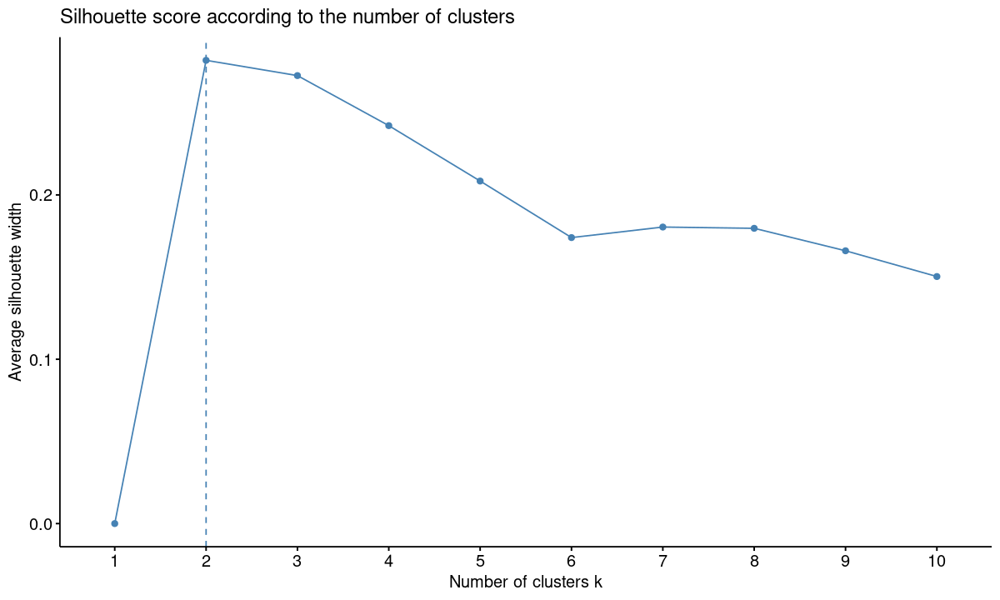

In [21]:
options(repr.plot.width = 10, repr.plot.height = 6)


fviz_nbclust(load, FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(load, FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")

According to the silhouette score, we would choose k = 2, but according to WSS, it is more difficult to determine.


  cluster size ave.sil.width
1       1  468          0.21
2       2  721          0.33
  cluster size ave.sil.width
1       1  521          0.35
2       2  380          0.21
3       3  288          0.21
  cluster size ave.sil.width
1       1  441          0.34
2       2  238          0.13
3       3  276          0.19
4       4  234          0.22
  cluster size ave.sil.width
1       1  204          0.10
2       2  216          0.07
3       3  272          0.16
4       4  192          0.22
5       5  305          0.29


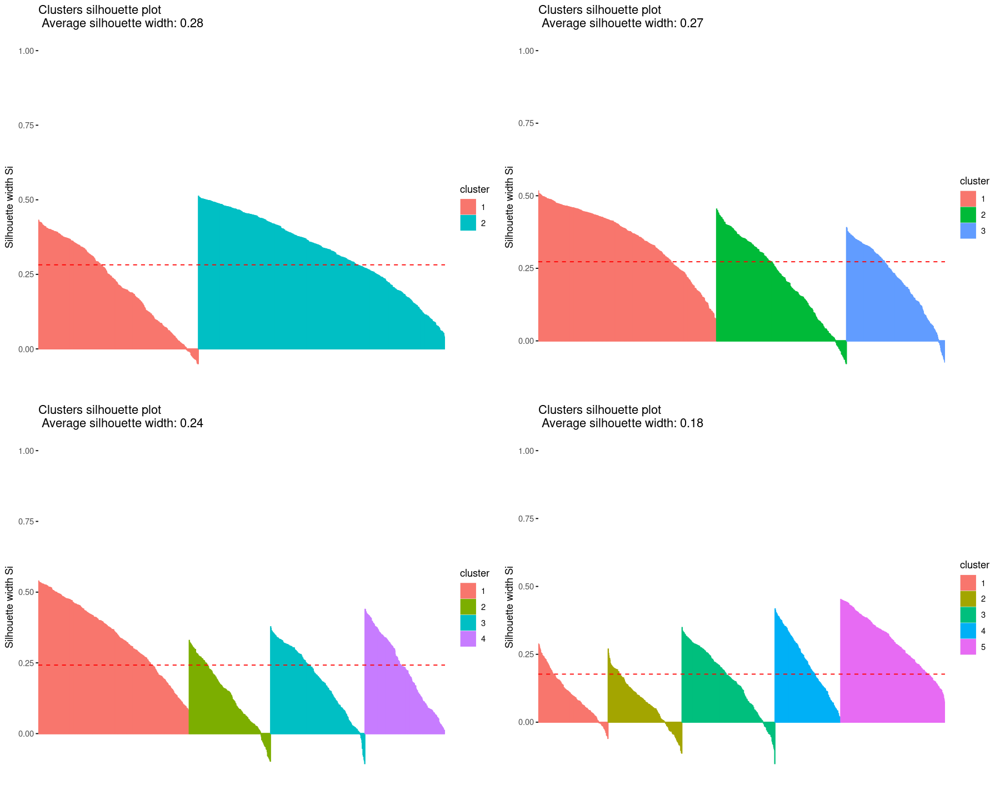

In [22]:
library(factoextra)
library(cluster)
options(repr.plot.width = 15, repr.plot.height = 12)

# With 2 clusters
reskmeans = kmeans(load, centers=2) 
sil = silhouette(reskmeans$cluster, dist(load))
p1 = fviz_silhouette(sil)

# With 3 clusters
reskmeans = kmeans(load, centers=3) 
sil = silhouette(reskmeans$cluster, dist(load))
p2 = fviz_silhouette(sil)

# With 4 clusters
reskmeans = kmeans(load, centers=4) 
sil = silhouette(reskmeans$cluster, dist(load))
p3 = fviz_silhouette(sil)

# With 5 clusters
reskmeans = kmeans(load, centers=5) 
sil = silhouette(reskmeans$cluster, dist(load))
p4 = fviz_silhouette(sil)

grid.arrange(p1,p2,p3, p4,ncol=2)

This confirms our choice of k = 2.

#### Interpretation and vizualisation of the clusters


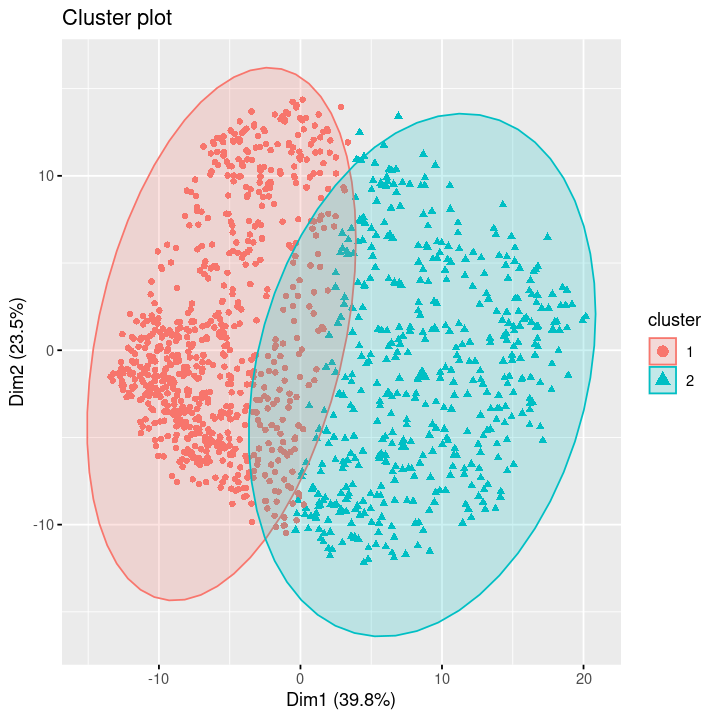

In [23]:
reskmeans = kmeans(load, centers=2) 
options(repr.plot.width = 6, repr.plot.height = 6)
fviz_cluster(reskmeans, data=load, ellipse.type="norm", labelsize=8, geom=c("point"))

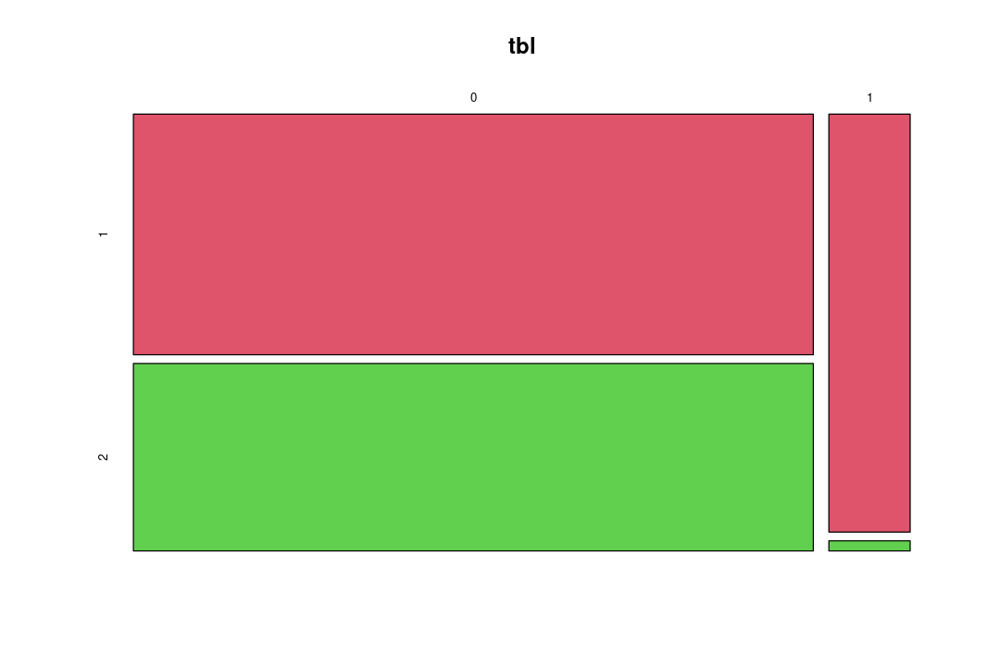

In [24]:
tbl = table(coord$bonus, reskmeans$cluster)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))


With this graph, we can see that the stations located on a hill are all in the same cluster, the first one. The ones not on a hill are almost equally divided between the two clusters.


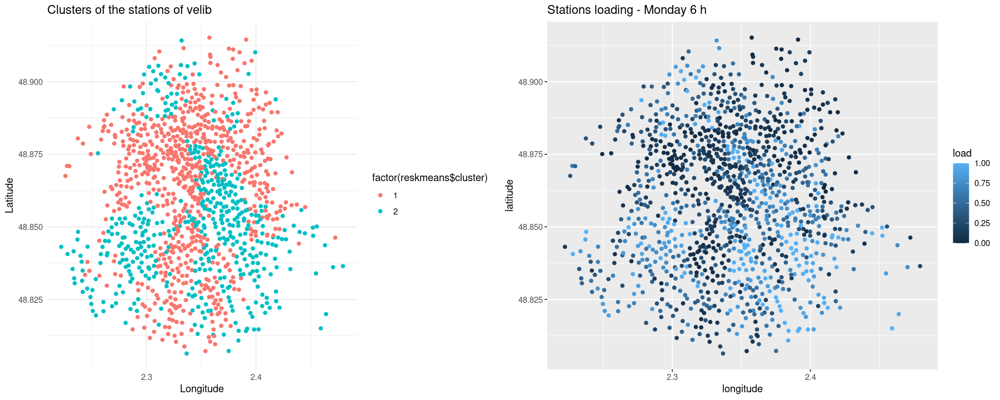

In [25]:
options(repr.plot.width = 15, repr.plot.height = 6)

p1 <- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(reskmeans$cluster))) + 
  labs(title = "Clusters of the stations of velib", x = "Longitude", y = "Latitude") +
  theme_minimal()

dfi$load = load[,6]
p2 = ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - Monday 6 h"))

grid.arrange(p1,p2,ncol=2)

By ploting the clusters by their location, we can see that they correspond more or less to the loading of the stations early in the morning and late in the evening.


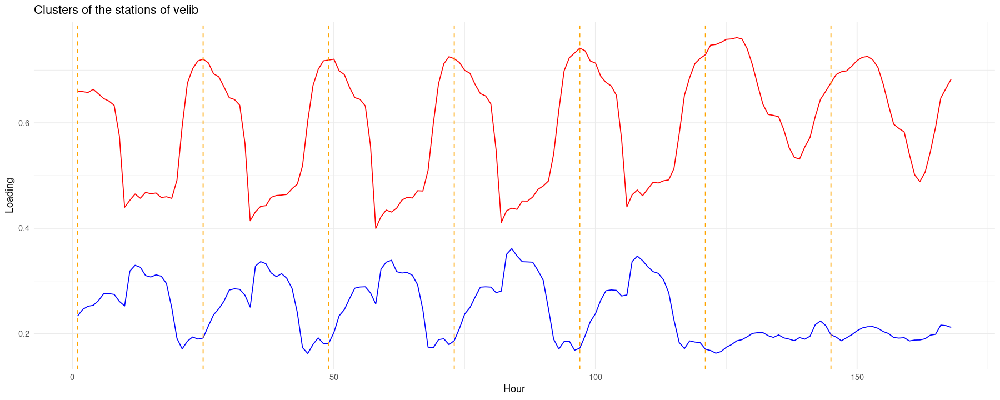

In [26]:
load1 = load[reskmeans$cluster==1,]
load2 =load[reskmeans$cluster==2,]
meanload1 = colMeans(load1)
meanload2 = colMeans(load2)
dfmean <- as.data.frame(meanload1)
dfmean$meanload2 <- meanload2
time_range = 1:ncol(load)
dfmean$time_range <-time_range
p1 <- ggplot(dfmean,aes(x=time_range)) + geom_line(aes(y=meanload1),color='blue') + geom_line(aes(y=meanload2),color='red') + 
  labs(title = "Clusters of the stations of velib", x = "Hour", y = "Loading") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
  theme_minimal()

p1

By ploting the average loading per hour per cluster, we can clearly separate the clusters. Indeed, the first cluster represents stations which are less used than cluster one. The stations in the cluster one are in average fuller than in the cluster 2. We can see that the loading averages compensate each other. We can say that the station in the cluster 2 are those where people leave the bikes during work and the cluster 1 is full of stations which are near where people lives.

### CAH


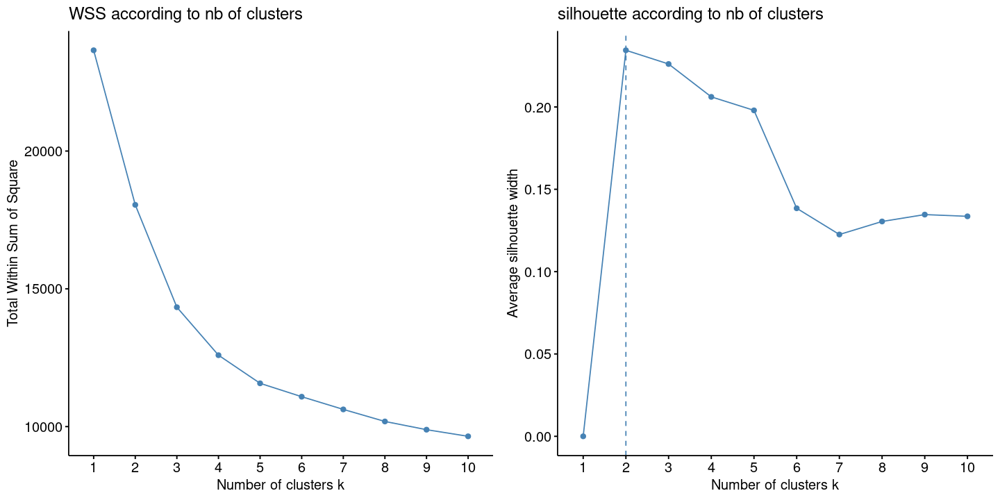

In [27]:
options(repr.plot.width = 12, repr.plot.height = 6)

grid.arrange(
    fviz_nbclust(load, FUNcluster=hcut, method="wss") + ggtitle("WSS according to nb of clusters"),
    fviz_nbclust(load, FUNcluster=hcut, method="silhouette") + ggtitle("silhouette according to nb of clusters"),
    ncol=2
)

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>.”


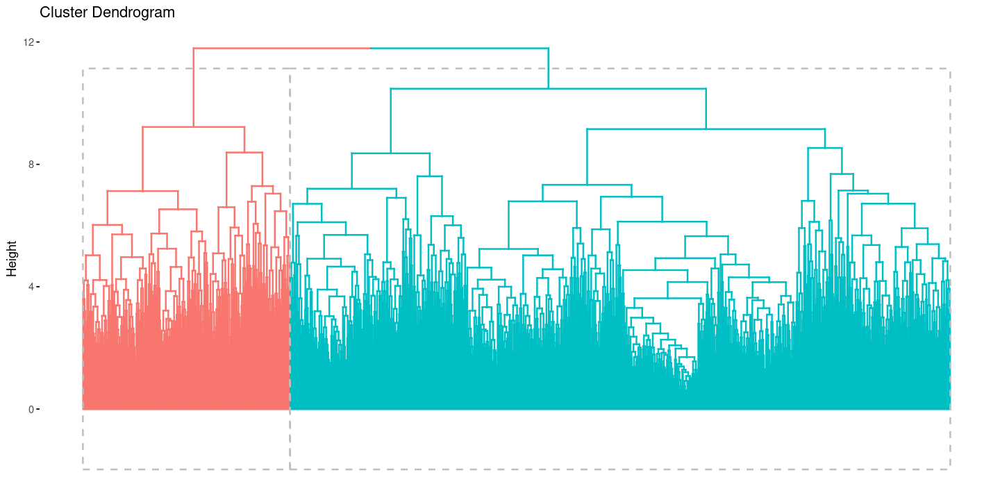

In [28]:
d = dist(load, method="euclidean")
hclustcomplete = hclust(d, method="complete")
reshclust1 = cutree(hclustcomplete, 2)

# --- #

fviz_dend(hclustcomplete, k=2, show_labels=FALSE, rect=TRUE)

   reshclust1
      1   2
  0 779 283
  1 126   1


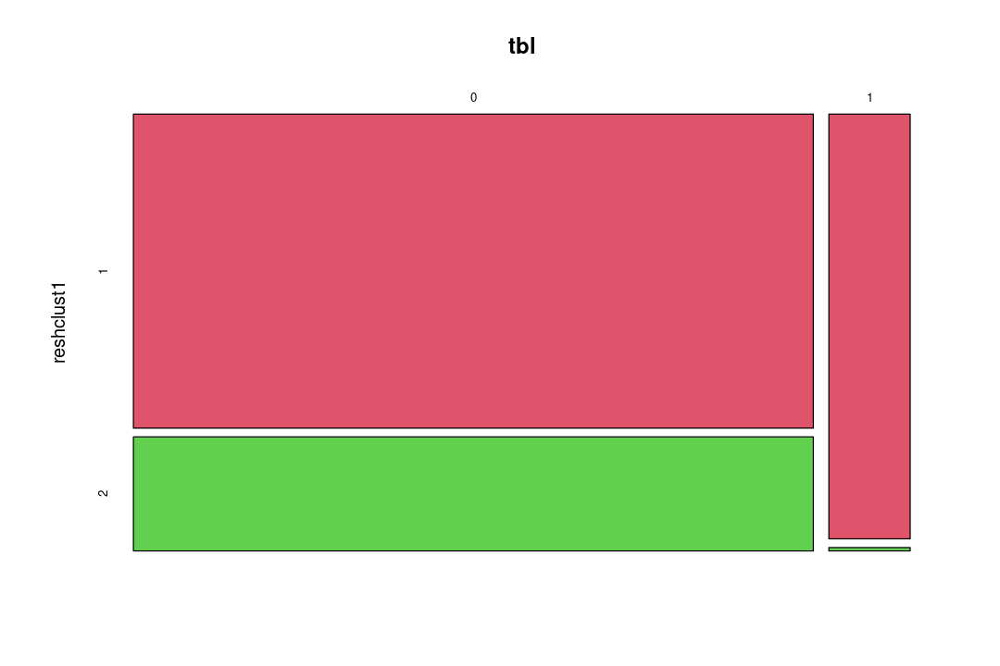

In [29]:
tbl = table(coord$bonus, reshclust1)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))

Once again, the stations located on a hill are all in the first cluster. However, the clusters are very unequal in size.


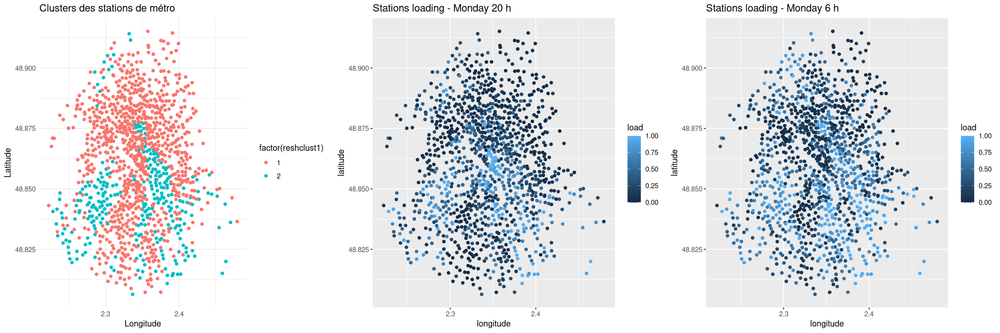

In [30]:
options(repr.plot.width = 18, repr.plot.height = 6)


p1 <- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(reshclust1))) +  
  labs(title = "Clusters des stations de métro", x = "Longitude", y = "Latitude") +
  theme_minimal()


dfi$load = load[,20]
p2 = ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - Monday 20 h"))

dfi$load = load[,6]
p3 = ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - Monday 6 h"))


grid.arrange(p1,p2,p3,ncol=3)


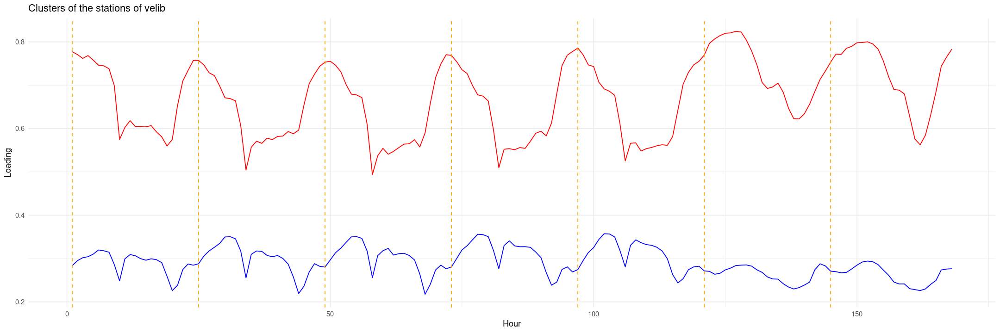

In [31]:
load1 = load[reshclust1==1,]
load2 =load[reshclust1==2,]
meanload1 = colMeans(load1)
meanload2 = colMeans(load2)
dfmean <- as.data.frame(meanload1)
dfmean$meanload2 <- meanload2
time_range = 1:ncol(load)
dfmean$time_range <-time_range
p1 <- ggplot(dfmean,aes(x=time_range)) + geom_line(aes(y=meanload1),color='blue') + geom_line(aes(y=meanload2),color='red') + 
  labs(title = "Clusters of the stations of velib", x = "Hour", y = "Loading") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
  theme_minimal()

p1

The clusters of the kmeans method and CAH method are similar. 

###GMM

In [32]:
library(mclust)
#resBICall = mclustBIC(load, G=2:20)
#summary(resBICall)

# --- #

#resBICall = Mclust(load, G=2:20)
#summary(resBICall)

#fviz_mclust(resBICall, what="BIC")


Package 'mclust' version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



The loading of thecode with so much data takes too long, so we'll only use this method with PCA.

## Clustering after PCA

### Kmeans

Choice of k:

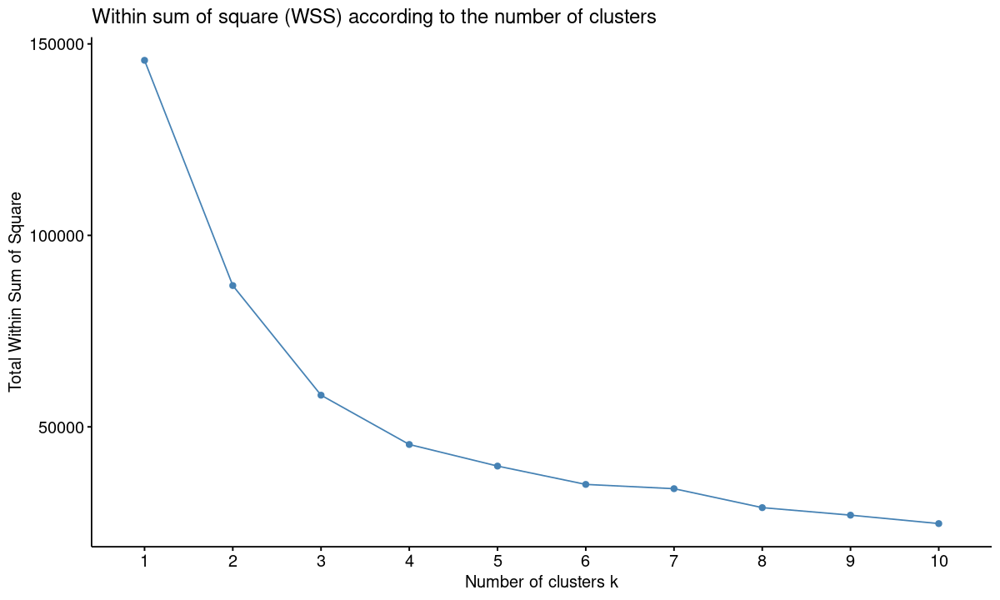

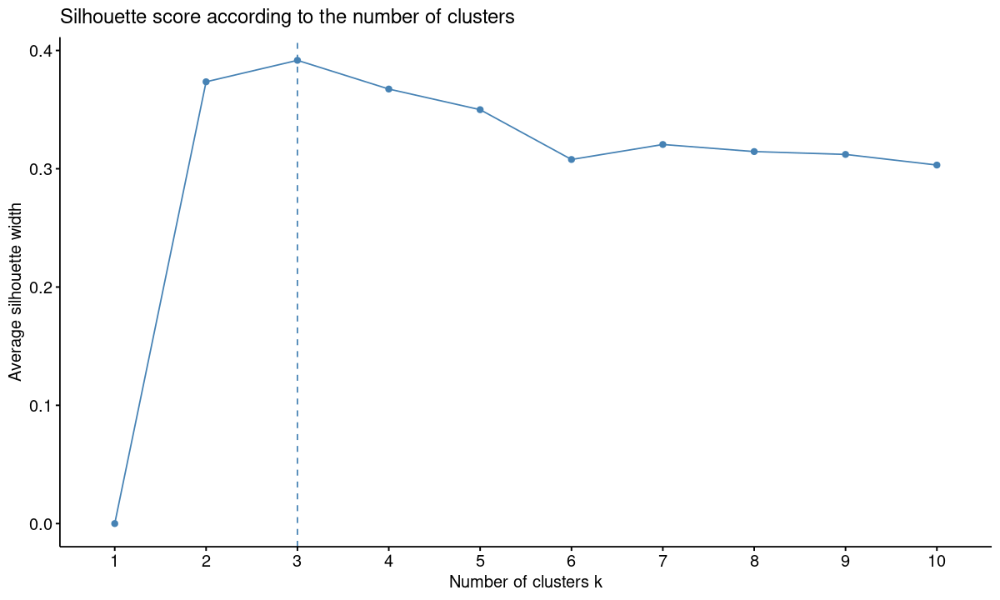

In [33]:
pca_data <- pca$ind$coord
options(repr.plot.width = 10, repr.plot.height = 6)


fviz_nbclust(pca_data, FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

fviz_nbclust(pca_data, FUNcluster=kmeans, method="silhouette") +
    ggtitle("Silhouette score according to the number of clusters")


  cluster size ave.sil.width
1       1  466          0.32
2       2  723          0.41
  cluster size ave.sil.width
1       1  535          0.46
2       2  370          0.33
3       3  284          0.35
  cluster size ave.sil.width
1       1  426          0.47
2       2  250          0.26
3       3  279          0.32
4       4  234          0.36
  cluster size ave.sil.width
1       1  202          0.21
2       2  219          0.26
3       3  270          0.30
4       4  193          0.34
5       5  305          0.40


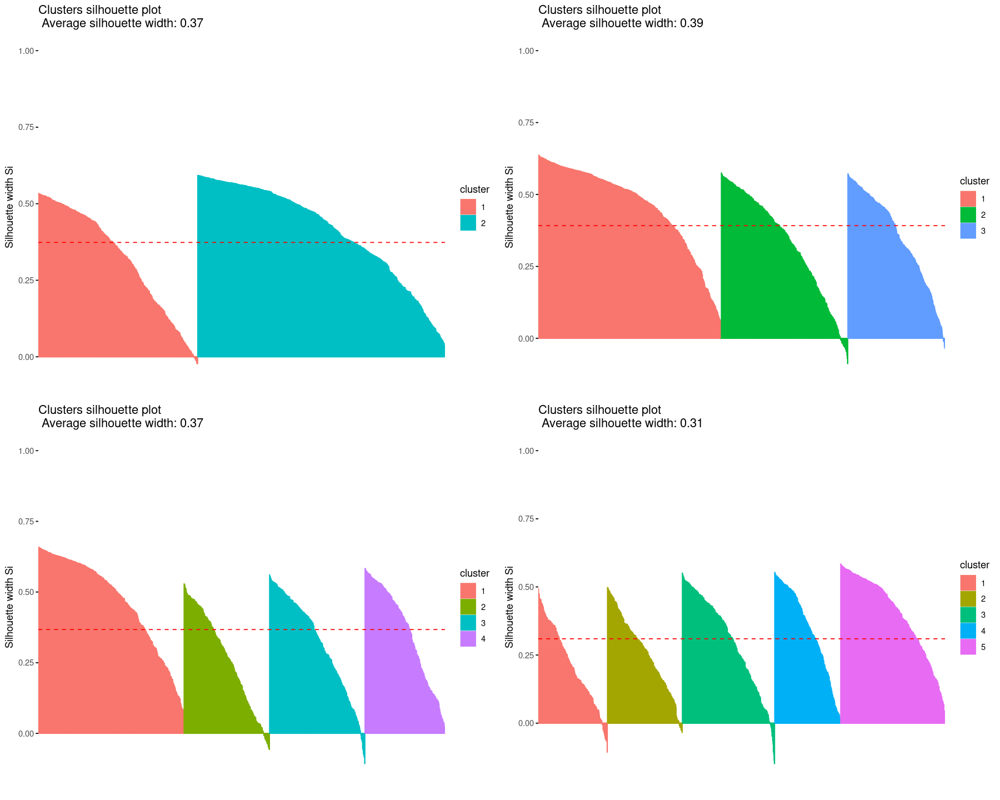

In [34]:
options(repr.plot.width = 15, repr.plot.height = 12)

# With 2 clusters
reskmeansp = kmeans(pca_data, centers=2) 
sil = silhouette(reskmeansp$cluster, dist(pca_data))
p1 = fviz_silhouette(sil)

# With 3 clusters
reskmeansp = kmeans(pca_data, centers=3) 
sil = silhouette(reskmeansp$cluster, dist(pca_data))
p2 = fviz_silhouette(sil)

# With 4 clusters
reskmeansp = kmeans(pca_data, centers=4) 
sil = silhouette(reskmeansp$cluster, dist(pca_data))
p3 = fviz_silhouette(sil)

# With 5 clusters
reskmeansp = kmeans(pca_data, centers=5) 
sil = silhouette(reskmeansp$cluster, dist(pca_data))
p4 = fviz_silhouette(sil)

grid.arrange(p1,p2,p3, p4,ncol=2)

Here, we can choose k = 2.

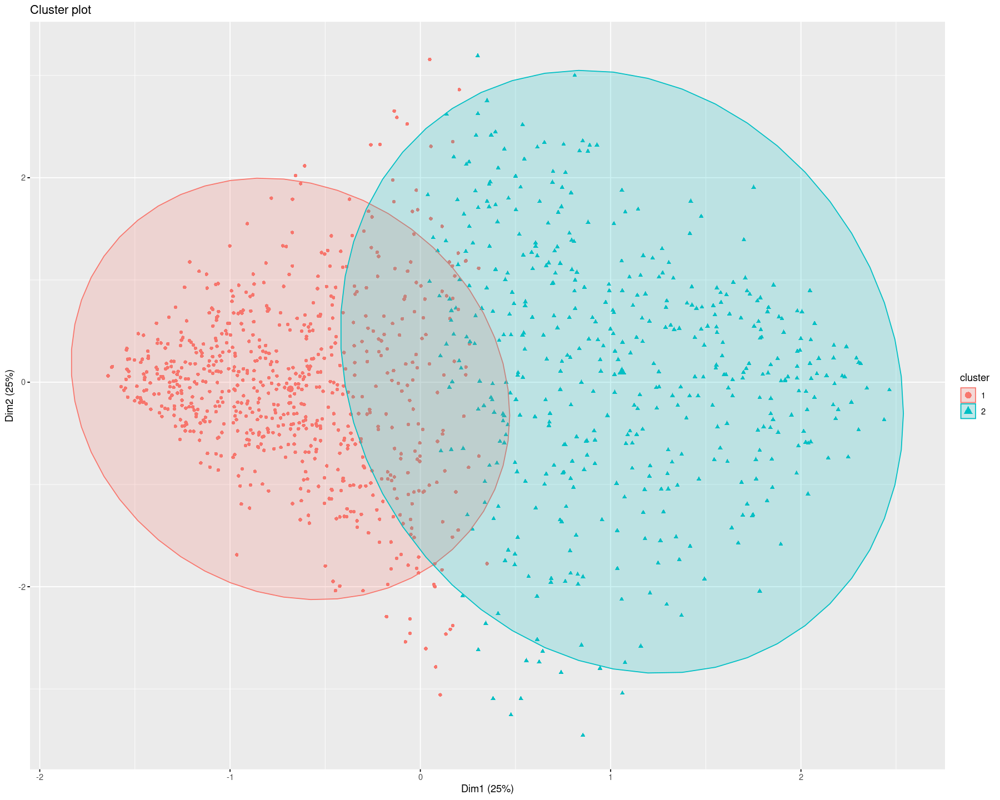

In [35]:
reskmeans2 = kmeans(pca_data, centers=2) 

fviz_cluster(reskmeans2, data=pca_data, ellipse.type="norm", labelsize=8, geom=c("point"))

   
      1   2
  0 599 463
  1 124   3


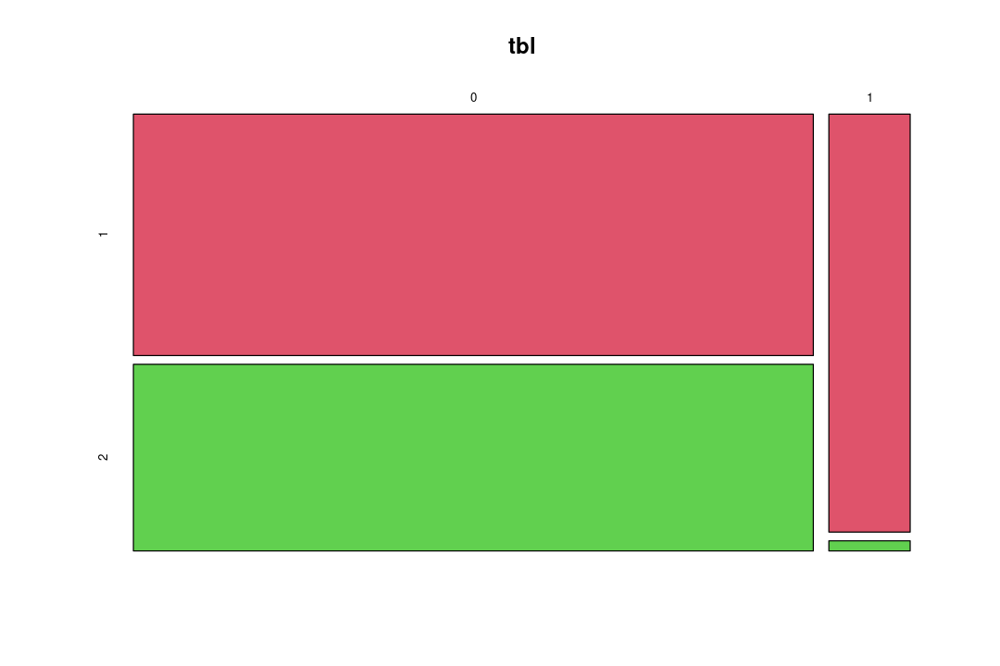

In [36]:
tbl = table(coord$bonus, reskmeans2$cluster)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))

Once more, the stations located on a hill are all in the same cluster, the second one here.


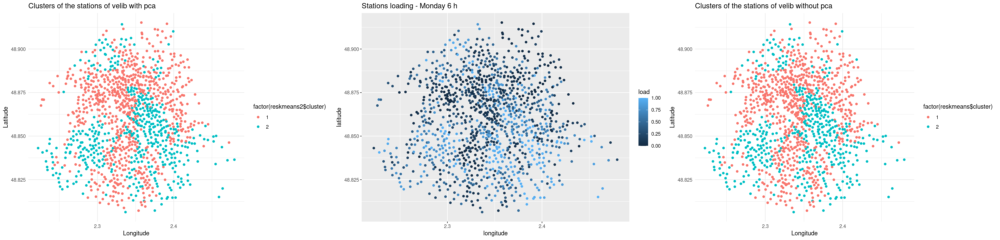

In [37]:
options(repr.plot.width = 25, repr.plot.height = 6)

p1 <- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(reskmeans2$cluster))) + 
  labs(title = "Clusters of the stations of velib with pca", x = "Longitude", y = "Latitude") +
  theme_minimal()

dfi$load = load[,6]
p2 <- ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - Monday 6 h"))

p3<- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(reskmeans$cluster))) + 
  labs(title = "Clusters of the stations of velib without pca", x = "Longitude", y = "Latitude") +
  theme_minimal()


grid.arrange(p1,p2,p3,ncol=3)


We can see that the clusters are the same but the cluster one with pca is the second without and same thing for the second one with pca which is the first one without.

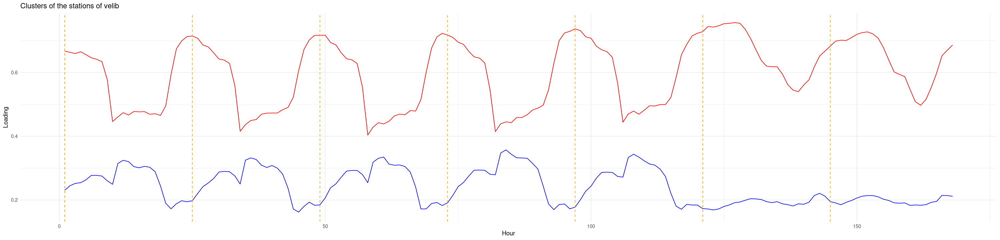

In [38]:
load1 = load[reskmeans2$cluster==1,]
load2 =load[reskmeans2$cluster==2,]
meanload1 = colMeans(load1)
meanload2 = colMeans(load2)
dfmean <- as.data.frame(meanload1)
dfmean$meanload2 <- meanload2
time_range = 1:ncol(load)
dfmean$time_range <-time_range
p1 <- ggplot(dfmean,aes(x=time_range)) + geom_line(aes(y=meanload1),color='blue') + geom_line(aes(y=meanload2),color='red') + 
  labs(title = "Clusters of the stations of velib", x = "Hour", y = "Loading") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
  theme_minimal()

p1


### CAH

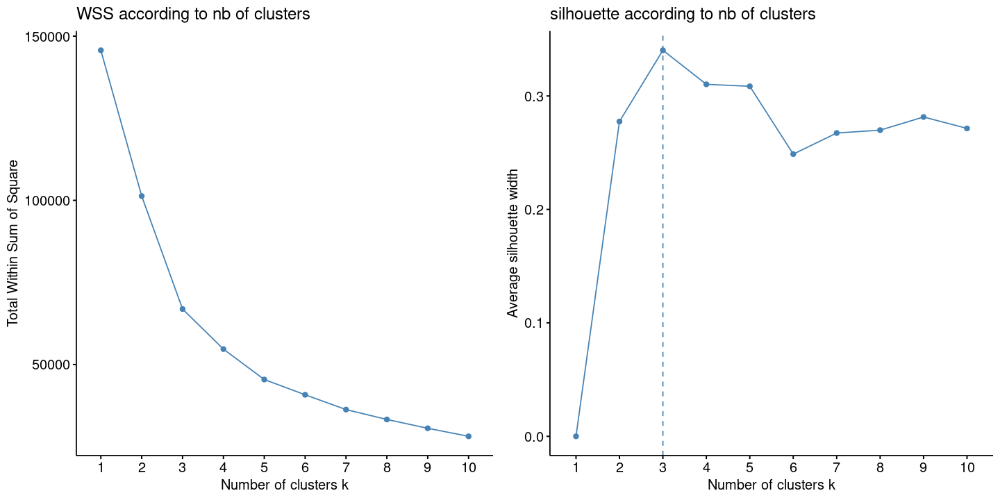

In [39]:
options(repr.plot.width = 12, repr.plot.height = 6)

grid.arrange(
    fviz_nbclust(pca_data, FUNcluster=hcut, method="wss") + ggtitle("WSS according to nb of clusters"),
    fviz_nbclust(pca_data, FUNcluster=hcut, method="silhouette") + ggtitle("silhouette according to nb of clusters"),
    ncol=2
)

Once more, we choose 3 clusters.

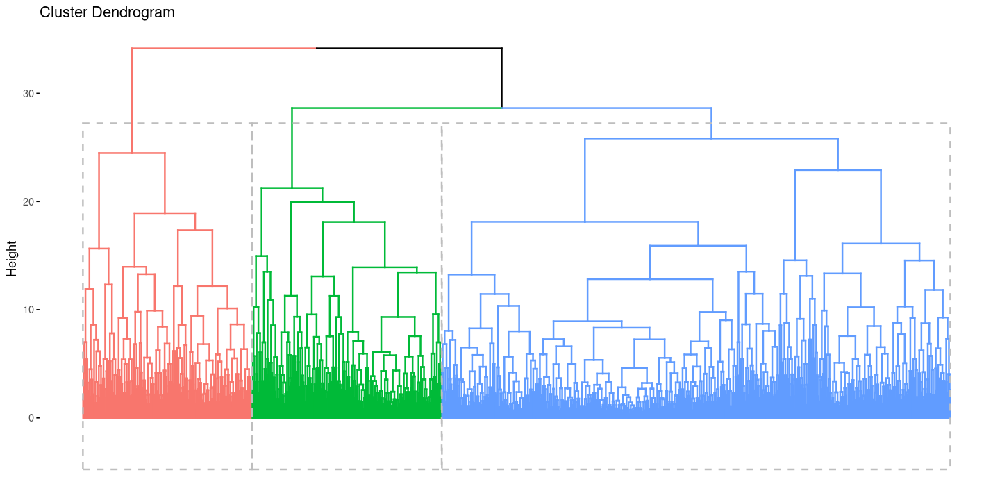

In [40]:
d = dist(pca_data, method="euclidean")
hclustcomplete = hclust(d, method="complete")
reshclust = cutree(hclustcomplete, 3)

# --- #

fviz_dend(hclustcomplete, k=3, show_labels=FALSE, rect=TRUE)

   reshclust
      1   2   3
  0 573 258 231
  1 124   2   1


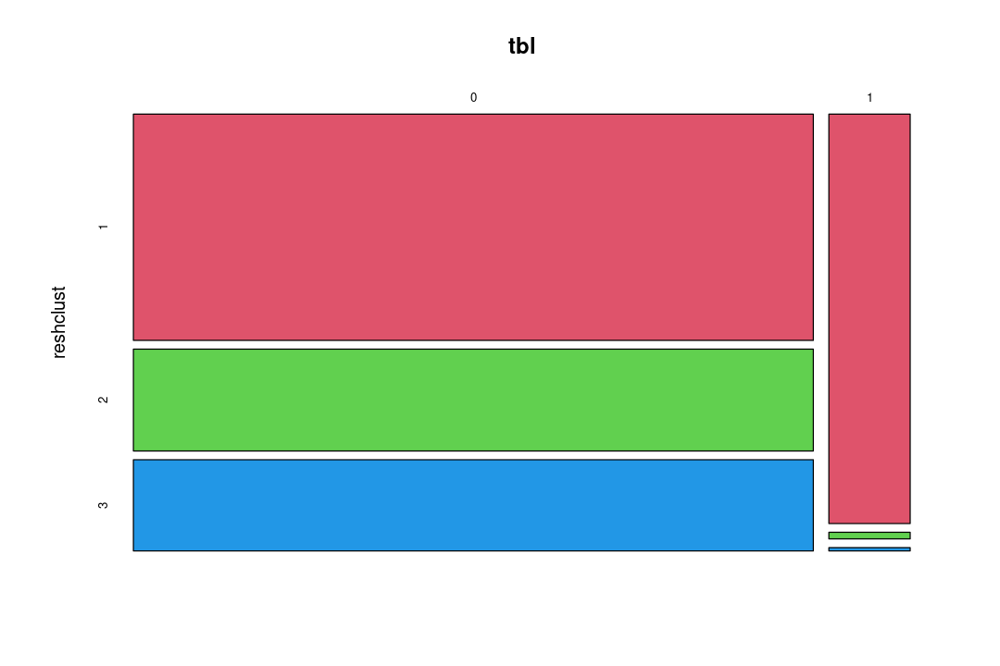

In [41]:
tbl = table(coord$bonus, reshclust)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))


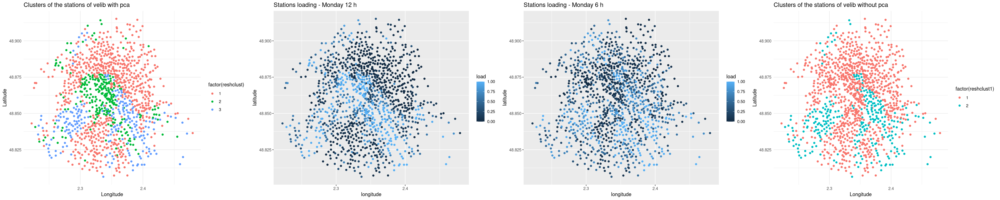

In [42]:
options(repr.plot.width = 30, repr.plot.height = 6)

p1 <- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(reshclust))) + 
  labs(title = "Clusters of the stations of velib with pca", x = "Longitude", y = "Latitude") +
  theme_minimal()

dfi$load = load[,12]
p2 <- ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - Monday 12 h"))

dfi$load = load[,6]
p3 <- ggplot(dfi, aes(x=longitude, y=latitude, color=load)) + 
        geom_point() +
        labs(title = paste("Stations loading - Monday 6 h"))

p4<- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(reshclust1))) + 
  labs(title = "Clusters of the stations of velib without pca", x = "Longitude", y = "Latitude") +
  theme_minimal()


grid.arrange(p1,p2,p3,p4,ncol=4)


We can see here that the first cluster is where the stations are always empty, the second one are those who become full during the day (where people goes to work), and the third one is the ones that are always full. We can clearly see here the movement of the people.

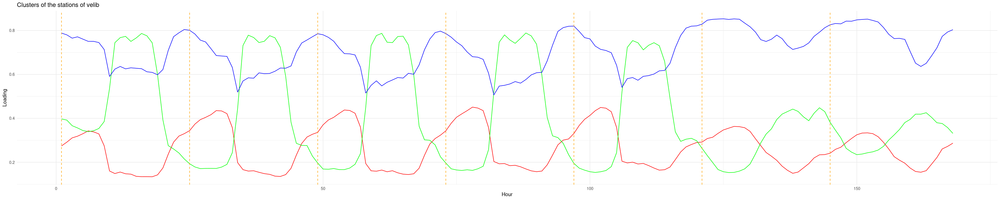

In [43]:
load1 = load[reshclust==1,]
load2 =load[reshclust==2,]
load3 =load[reshclust==3,]
meanload1 = colMeans(load1)
meanload2 = colMeans(load2)
meanload3 = colMeans(load3)
dfmean <- as.data.frame(meanload1)
dfmean$meanload2 <- meanload2
dfmean$meanload3 <- meanload3
time_range = 1:ncol(load)
dfmean$time_range <-time_range
p1 <- ggplot(dfmean,aes(x=time_range)) + geom_line(aes(y=meanload1),color='red') + geom_line(aes(y=meanload2),color='green')  + geom_line(aes(y=meanload3),color='blue')+ 
  labs(title = "Clusters of the stations of velib", x = "Hour", y = "Loading") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
  theme_minimal()

p1

With this graph, we can clearly see that the second cluster represents the movement of the people.




### GMM 


Best BIC values:
            VVE,7        VEV,7        VVE,6
BIC      -26176.5 -26185.05296 -26214.49973
BIC diff      0.0     -8.55482    -38.00159

---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVE (ellipsoidal, equal orientation) model with 7 components: 

 log-likelihood    n df      BIC       ICL
       -12847.5 1189 68 -26176.5 -26494.55

Clustering table:
  1   2   3   4   5   6   7 
130 179 283 130 154 207 106 

Warning message:
“`gather_()` was deprecated in tidyr 1.2.0.
ℹ Please use `gather()` instead.
ℹ The deprecated feature was likely used in the factoextra package.
  Please report the issue at <https://github.com/kassambara/factoextra/issues>.”


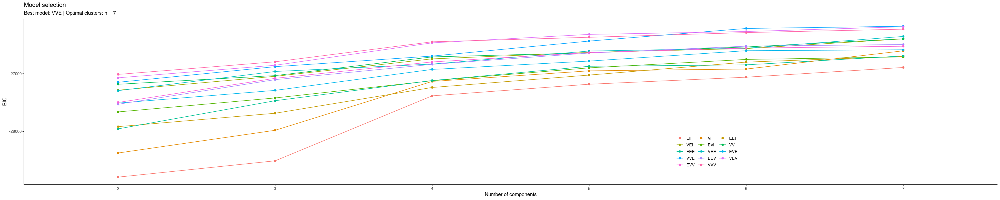

In [44]:
library(mclust)
resBICall = mclustBIC(pca_data, G=2:7)
summary(resBICall)

# --- #

resBICall = Mclust(pca_data, G=2:7)
summary(resBICall)

fviz_mclust(resBICall, what="BIC")

In [45]:

gmm_mod <- Mclust(data = pca_data, G=7, nstart=10)


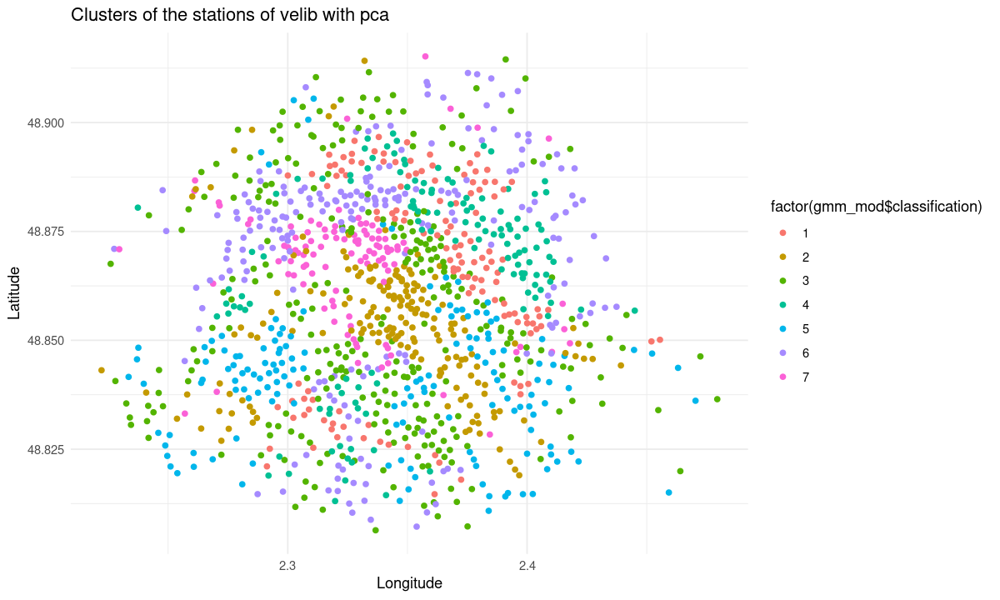

In [46]:
options(repr.plot.width = 10, repr.plot.height = 6)

p1 <- ggplot(load, aes(x = coord$longitude, y = coord$latitude)) +
  geom_point(aes(color = factor(gmm_mod$classification))) + 
  labs(title = "Clusters of the stations of velib with pca", x = "Longitude", y = "Latitude") +
  theme_minimal()

p1

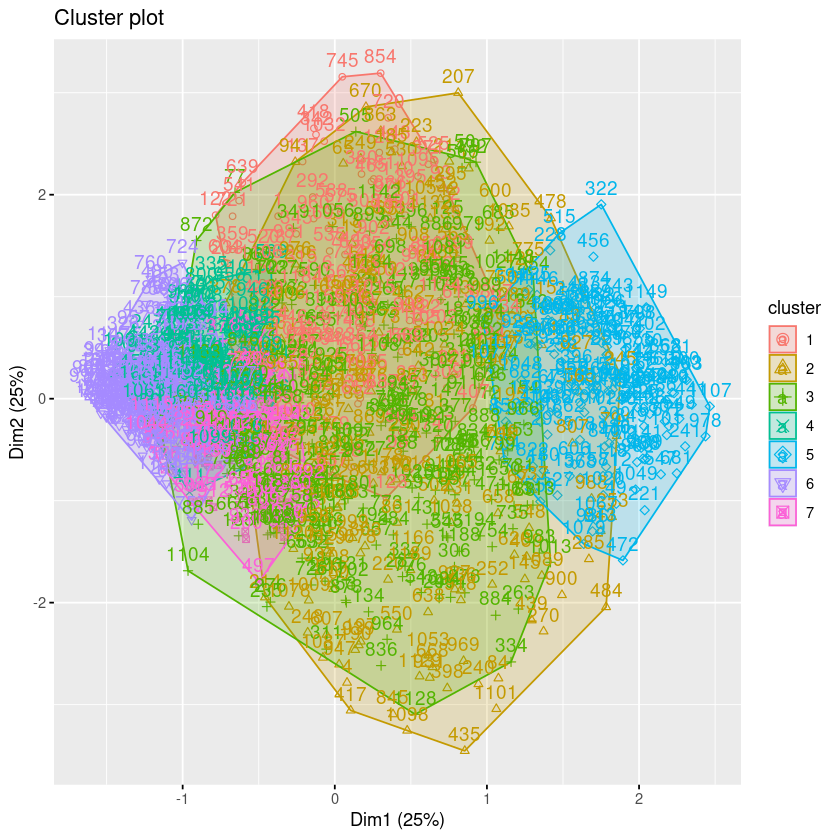

In [47]:
options(repr.plot.width = 7, repr.plot.height = 7)
print(fviz_cluster(object=gmm_mod,data=compo_acp,show.clust.cent=TRUE,ellipse=TRUE))

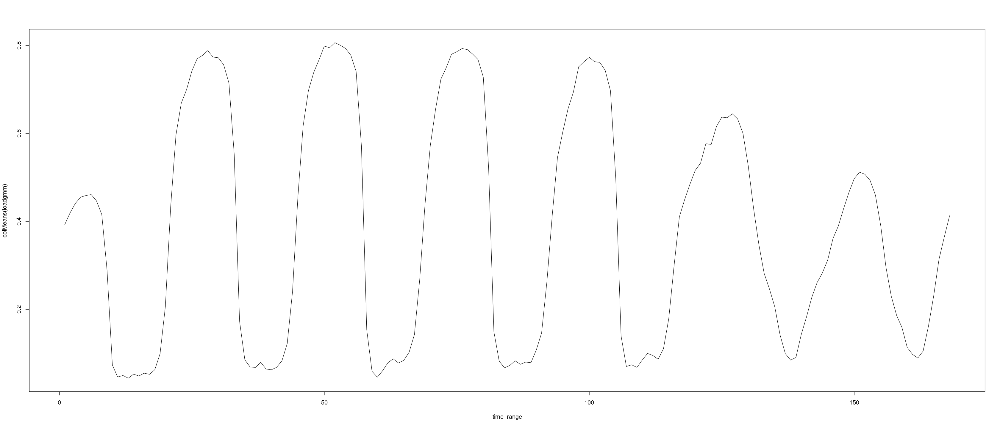

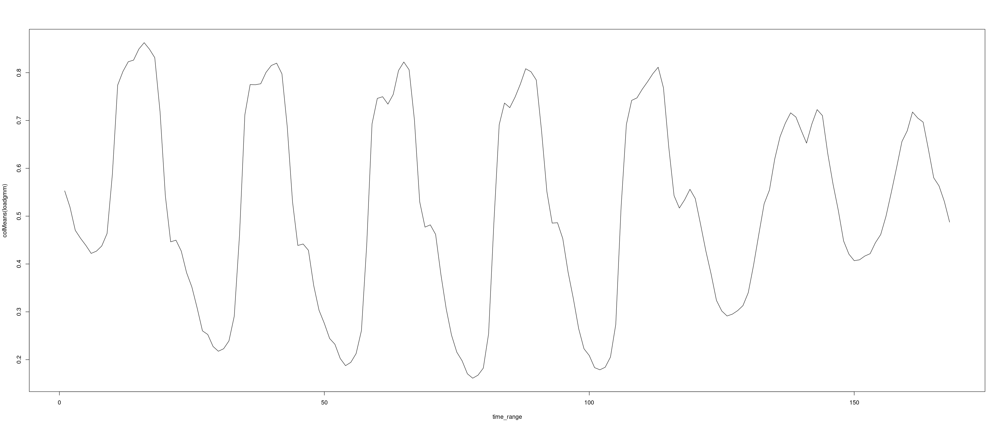

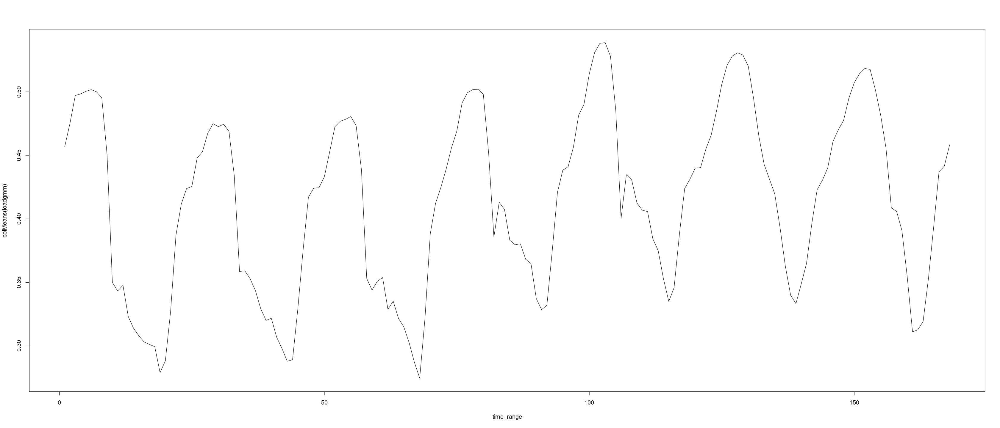

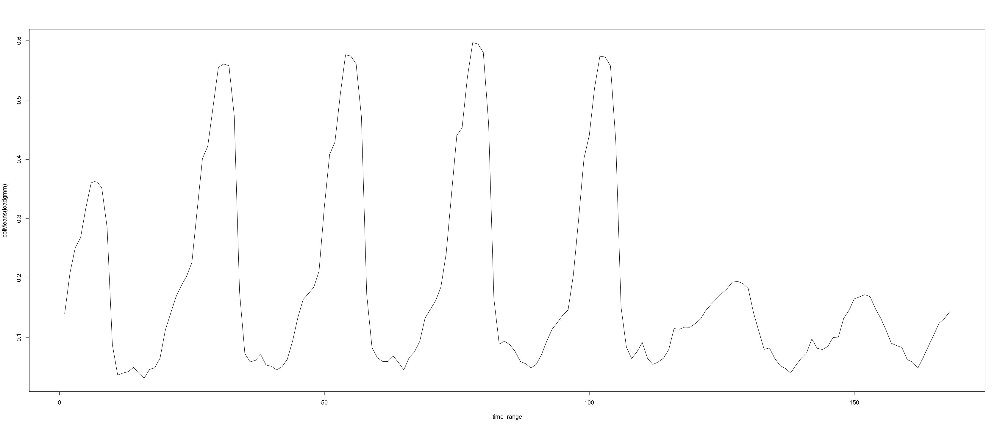

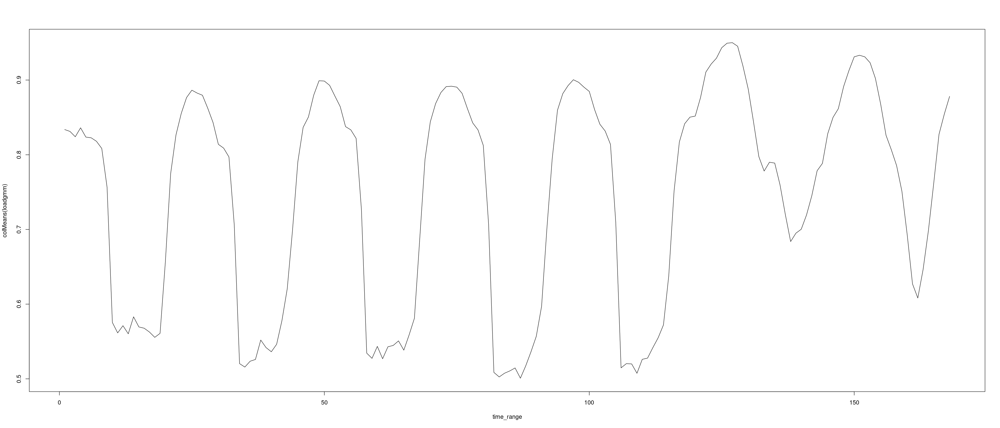

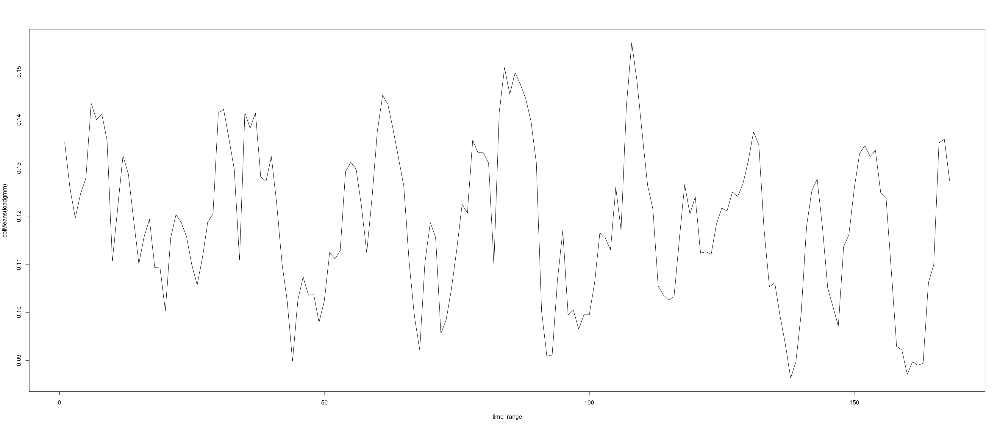

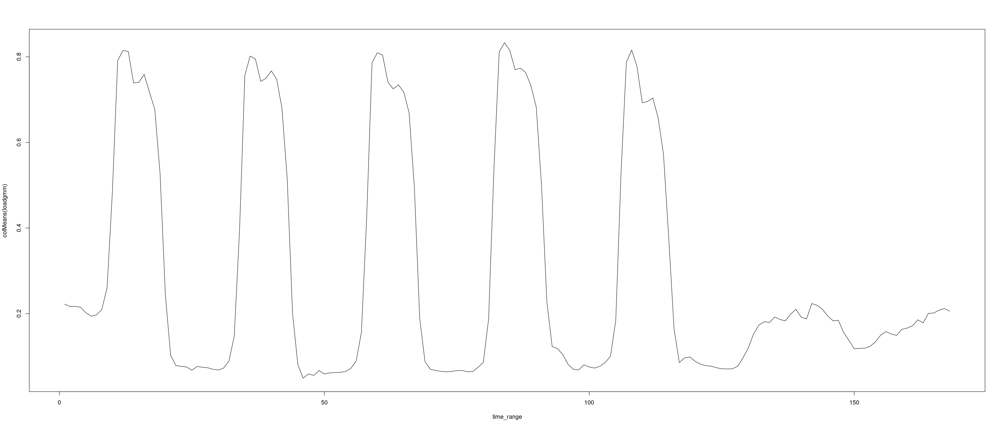

In [48]:
nc_gmm = 7
time_range = 1:ncol(load)

options(repr.plot.width = 28, repr.plot.height =12)


for (i in 1:nc_gmm){
    loadgmm <- load[gmm_mod$classification==i,]
    plot(time_range,colMeans(loadgmm), type = "l")}

In [49]:
load1 = load[gmm_mod$classification==1,]
load2 =load[gmm_mod$classification==2,]
load3 =load[gmm_mod$classification==3,]
load4 = load[gmm_mod$classification==4,]
load5 =load[gmm_mod$classification==5,]
load6 =load[gmm_mod$classification==6,]
load7 = load[gmm_mod$classification==7,]
meanload2 = colMeans(load2)
meanload3 = colMeans(load3)
meanload4 = colMeans(load4)
meanload5 = colMeans(load5)
meanload6 = colMeans(load6)
meanload7 = colMeans(load7)
dfmean <- as.data.frame(meanload1)
dfmean$meanload2 <- meanload2
dfmean$meanload3 <- meanload3
dfmean$meanload4 <- meanload4
dfmean$meanload5 <- meanload5
dfmean$meanload6 <- meanload6
dfmean$meanload7 <- meanload7
time_range = 1:ncol(load)
dfmean$time_range <-time_range


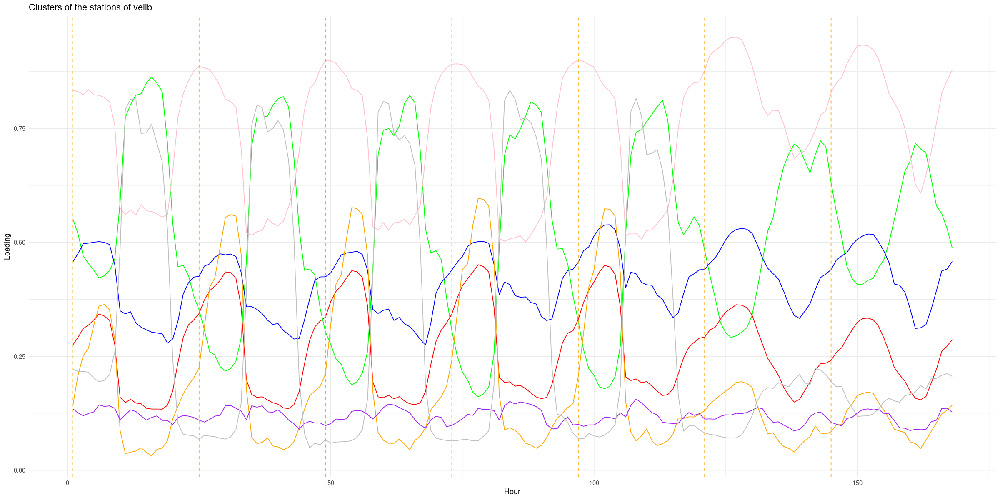

In [50]:
options(repr.plot.width = 20, repr.plot.height =10)

p1 <- ggplot(dfmean,aes(x=time_range)) + geom_line(aes(y=meanload1),color='red') + geom_line(aes(y=meanload2),color='green')  + geom_line(aes(y=meanload3),color='blue')+ 
geom_line(aes(y=meanload4),color='orange')+ geom_line(aes(y=meanload5),color='pink')+ geom_line(aes(y=meanload6),color='purple')+ geom_line(aes(y=meanload7),color='grey')+ 
  labs(title = "Clusters of the stations of velib", x = "Hour", y = "Loading") +
     geom_vline(xintercept=time_tick, col="orange", linetype="dashed") +
  theme_minimal()
p1

## Comparison



### PCA VS Non-PCA


### PCA, different methods of clustering



In [86]:
library(ggimage)
#library(rsvg)

In [90]:
install.packages('ggimage')

Installation du package dans ‘/home/danh-nghet/R/libs’
(car ‘lib’ n'est pas spécifié)

installation de la dépendance ‘magick’


Warning message in install.packages("ggimage"):
“l'installation du package ‘magick’ a eu un statut de sortie non nul”
Warning message in install.packages("ggimage"):
“l'installation du package ‘ggimage’ a eu un statut de sortie non nul”


In [87]:

ClassK3 = reshclust

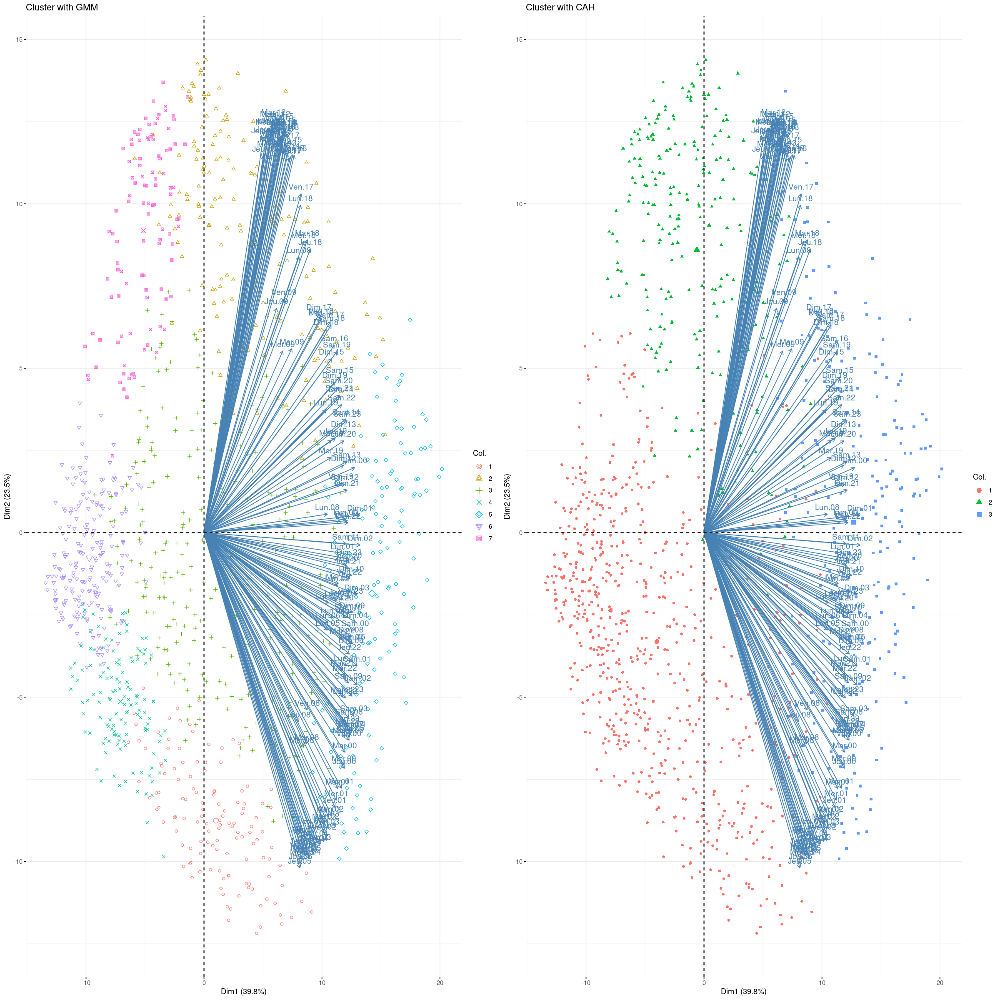

In [88]:
grid.arrange(
    fviz_pca(pca,col.ind=as.factor(gmm_mod$classification), geom=c("point"), axes=c(1,2)) + ggtitle("Cluster with GMM"),
    fviz_pca(pca,col.ind=as.factor(ClassK3), geom=c("point"), axes=c(1,2)) + ggtitle("Cluster with CAH") ,
    ncol=2
)


In [89]:
table('CAH'=reshclust, 'GMM'=gmm_mod$classification)

# --- #

# With the confusion matrix
conf_mat = confusion_matrix(targets=reshclust, predictions=gmm_mod$classification )
plot_confusion_matrix(conf_mat)

   GMM
CAH   1   2   3   4   5   6   7
  1 130   5 199 130   6 207  20
  2   0 119  55   0   0   0  86
  3   0  55  29   0 148   0   0

ERROR: Error in confusion_matrix(targets = reshclust, predictions = gmm_mod$classification): impossible de trouver la fonction "confusion_matrix"


In [ ]:
options(repr.plot.width = 20, repr.plot.height =10)
grid.arrange(
    fviz_pca(pca, col.ind=as.factor(reskmeans2$cluster), geom=c("point"), axes=c(1,2)) + ggtitle("Cluster with Kmeans"),
    fviz_pca(pca, col.ind=as.factor(reshclust), ellipse.type="norm", geom="point", axes=c(1,2)) + ggtitle("Cluster with CAH"),
    ncol=2
)

In [ ]:
table('CAH'=reshclust, 'Kmean'=reskmeans$cluster)

# --- #

# With the confusion matrix
conf_mat = confusion_matrix(targets=reshclust, predictions=reskmeans2$cluster )
plot_confusion_matrix(conf_mat)

In [ ]:
grid.arrange(
    fviz_pca(pca, col.ind=as.factor(reskmeans$cluster), geom=c("point"), axes=c(1,2)) + ggtitle("Cluster with Kmeans"),
    fviz_pca(pca, col.ind=as.factor(gmm_mod$classification), ellipse.type="norm", geom="point", axes=c(1,2)) + ggtitle("Cluster with GMM"),
    ncol=2
)


In [ ]:
# --- #

conf_mat = confusion_matrix(targets=gmm_mod$classification, predictions=reskmeans2$cluster )
plot_confusion_matrix(conf_mat)

# MCA


seuiller jour en 7, en 14 (moyenne)


In [55]:
loadMCA1 <- load

# Adding weekdays as categories
week <- c("Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday")
d = 1

for (i in seq(1, dim(load)[2], by=24)){
    loadMCA1[, week[d]] = rowMeans(loadMCA1[seq(i, i+23, by=1)])
    d <- d + 1   
    }



In [56]:
# Dividing day into four categories: 
#   0  - 6: Night
#   7  - 12: Morning
#   13 - 17: Day
#   18 - 24: Evening
loadMCA1[, "Night"] = replicate(dim(loadMCA1)[1], numeric(1))
loadMCA1[, "Morning"] = replicate(dim(loadMCA1)[1], numeric(1))
loadMCA1[, "Day"] = replicate(dim(loadMCA1)[1], numeric(1))
loadMCA1[, "Evening"] = replicate(dim(loadMCA1)[1], numeric(1)) 

for (i in seq(1, dim(load)[2], by=24)){
    loadMCA1[, "Evening"] <-  loadMCA1[, "Evening"] + rowMeans(loadMCA1[, seq(i, i + 5, by=1)])/7
    loadMCA1[, "Day"] <-  loadMCA1[, "Day"] + rowMeans(loadMCA1[, seq(i + 6, i + 12, by=1)])/7
    loadMCA1[, "Morning"] <-  loadMCA1[, "Morning"] + rowMeans(loadMCA1[, seq(i + 2*6, i + 18, by=1)])/7
    loadMCA1[, "Night"] <-  loadMCA1[, "Night"] + rowMeans(loadMCA1[, seq(i + 3*6, i + 24, by=1)])/7
}

loadMCA2 <- loadMCA1[,(1+dim(load)[2]):dim(loadMCA1)[2]]

In [57]:
Hill <- factor(coord$bonus, labels = c("No","Yes"))

Separation = c(0,0.25,0.5,0.75,1)

loadMCA <- loadMCA2

loadMCA[0<=loadMCA2&loadMCA2<0.25] = 'A'
loadMCA[0.25<=loadMCA2&loadMCA2<0.5] = 'B'
loadMCA[0.5<=loadMCA2&loadMCA2<0.75] = 'C'
loadMCA[0.75<=loadMCA2&loadMCA2<=1] = 'D'

print(head(loadMCA))
print(head(loadMCA2))

  Monday Tuesday Wednesday Thursday Friday Saturday Sunday Night Morning Day
1      A       B         B        B      B        A      A     B       A   A
2      B       C         C        C      C        C      B     C       A   B
3      B       C         B        B      C        C      B     C       C   B
4      D       B         B        B      B        B      C     A       C   C
5      C       C         C        B      C        B      B     C       C   B
6      A       B         B        B      B        C      A     B       A   B
  Evening
1       B
2       D
3       B
4       A
5       B
6       B
     Monday   Tuesday Wednesday  Thursday    Friday  Saturday    Sunday
1 0.1111493 0.2964616 0.3785273 0.3613867 0.4185957 0.2448192 0.1340812
2 0.3423913 0.5797101 0.5108696 0.5724638 0.5289855 0.6050725 0.4040679
3 0.2738741 0.6266798 0.3893939 0.4568182 0.5717312 0.5321409 0.4166667
4 0.7599206 0.3670635 0.3091931 0.3302599 0.3115079 0.3115079 0.6527778
5 0.7366092 0.6083758 0.5507157

In [58]:
loadMCA$Hill <- Hill

££

ERROR: Error in parse(text = x, srcfile = src): <text>:3:1: invalid token inattendu(e)
2: 
3: £
   ^


In [59]:

for (i in seq(1, dim(loadMCA2)[2])){
    q1 <- quantile(loadMCA2[,i],0.25,names=FALSE)
    q2 <- quantile(loadMCA2[,i],0.5,names=FALSE)
    q3 <- quantile(loadMCA2[,i],0.75,names=FALSE)
    loadMCA[0<=loadMCA2[,i]&loadMCA2[,i]<q1,i] = 'A'
    loadMCA[q1<=loadMCA2[,i]&loadMCA2[,i]<q2,i] = 'B'
    loadMCA[q2<=loadMCA2[,i]&loadMCA2[,i]<q3,i] = 'C'
    loadMCA[q3<=loadMCA2[,i]&loadMCA2[,i]<=1,i] = 'D'}


In [60]:
res.mca = MCA(loadMCA, graph=FALSE)
print(res.mca)

**Results of the Multiple Correspondence Analysis (MCA)**
The analysis was performed on 1189 individuals, described by 11 variables
*The results are available in the following objects:

   name              description                       
1  "$eig"            "eigenvalues"                     
2  "$var"            "results for the variables"       
3  "$var$coord"      "coord. of the categories"        
4  "$var$cos2"       "cos2 for the categories"         
5  "$var$contrib"    "contributions of the categories" 
6  "$var$v.test"     "v-test for the categories"       
7  "$var$eta2"       "coord. of variables"             
8  "$ind"            "results for the individuals"     
9  "$ind$coord"      "coord. for the individuals"      
10 "$ind$cos2"       "cos2 for the individuals"        
11 "$ind$contrib"    "contributions of the individuals"
12 "$call"           "intermediate results"            
13 "$call$marge.col" "weights of columns"              
14 "$call$marge.li"  "weights 

,eigenvalue,percentage of variance,cumulative percentage of variance
dim 1,0.7037793,23.459310,23.45931
dim 2,0.3706966,12.356552,35.81586
dim 3,0.1931155,6.437183,42.25305
dim 4,0.1355194,4.517315,46.77036
dim 5,0.1278386,4.261286,51.03165
dim 6,0.1036858,3.456192,54.48784


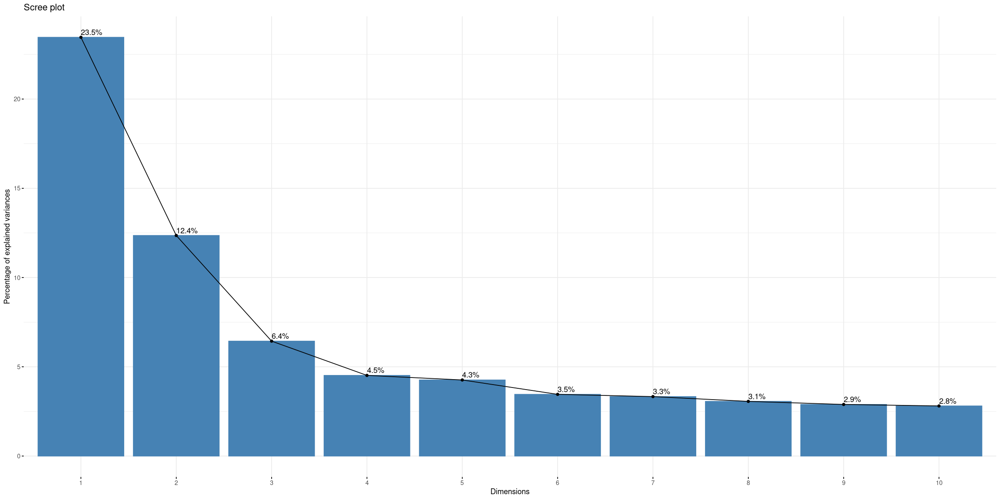

In [61]:
head(res.mca$eig)

fviz_screeplot(res.mca, addlabels=TRUE)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Night,Morning,Day,Evening
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
868,D,D,D,D,C,D,D,D,D,D,D


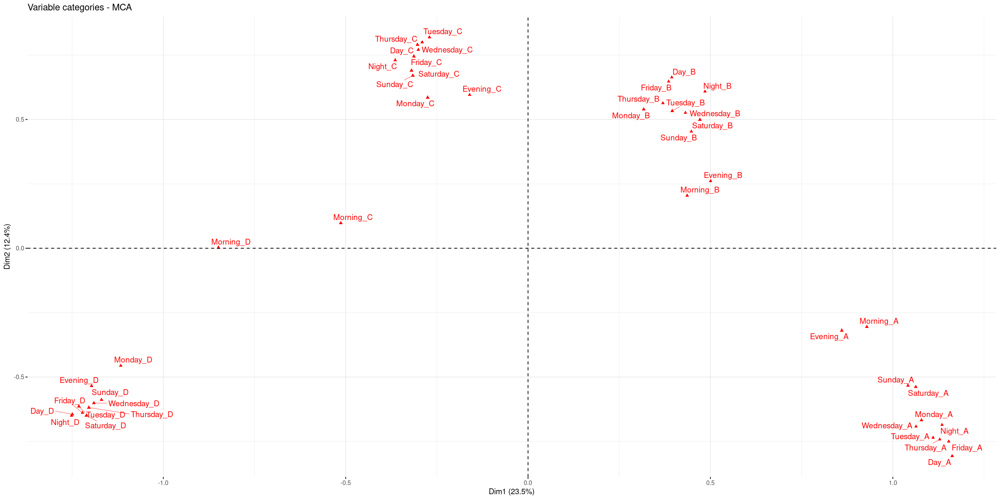

In [62]:
fviz_mca_var(res.mca,repel = TRUE)

loadMCA[868,]

Dimension 1 -> describe the loading of the stations, more it is on the right more it is full
if a station is far on the left, it is more succeptible to have a low loading and to be on a hill, if it is on the right, to have a high loading. We can't say anything about the stations not being on a hill


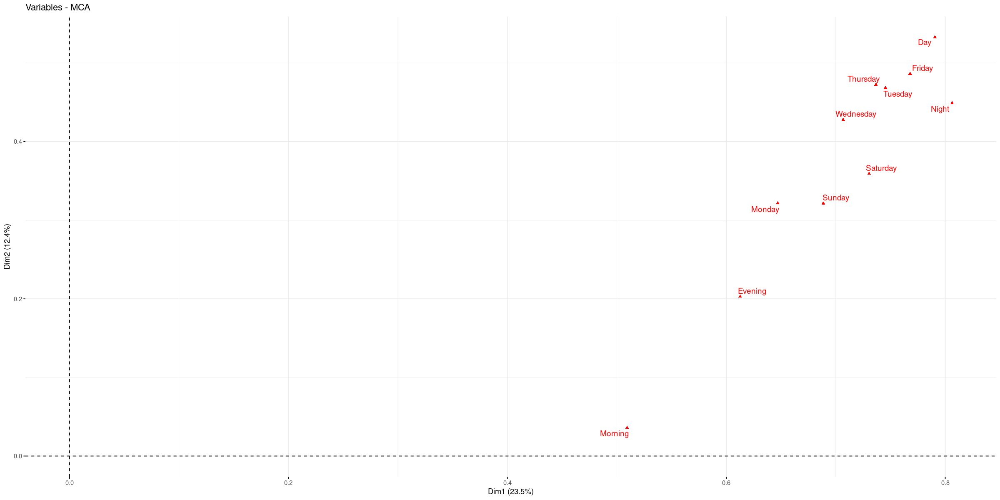

In [63]:
fviz_mca_var(res.mca, choice="mca.cor", repel=TRUE)

lien modéré entre vivre le jour la semaine et vivre la nuit le week end

In [64]:
# cos2: quality of representation of rows
head(res.mca$var$cos2)

# --- #

i = c(1:2)

idx = which.max( rowSums(res.mca$var$cos2[,i]) )
hobby = row.names(res.mca$var$cos2)[idx]

print(paste("best represented in Plan", i[1], '-', i[2], "is", hobby))

idx = which.min( rowSums(res.mca$var$cos2[,i]) )
hobby = row.names(res.mca$var$cos2)[idx]

print(paste("worst represented in Plan", i[1], '-', i[2], "is", hobby))

,Dim 1,Dim 2,Dim 3,Dim 4,Dim 5
Monday_A,0.38726668,0.14819690,0.007978296,0.0039112572,3.203546e-05
Monday_B,0.03348069,0.09696413,0.070870110,0.0199327795,2.205255e-01
Monday_C,0.02522161,0.11400646,0.080760622,0.0037015981,2.008123e-01
Monday_D,0.41699074,0.06957989,0.011485613,0.0003162268,7.349624e-04
Tuesday_A,0.41060139,0.18033405,0.028816903,0.0298891232,2.733291e-02
Tuesday_B,0.05203653,0.09462214,0.249187795,0.0153853910,1.226859e-02


[1] "best represented in Plan 1 - 2 is Day_A"
[1] "worst represented in Plan 1 - 2 is Morning_B"


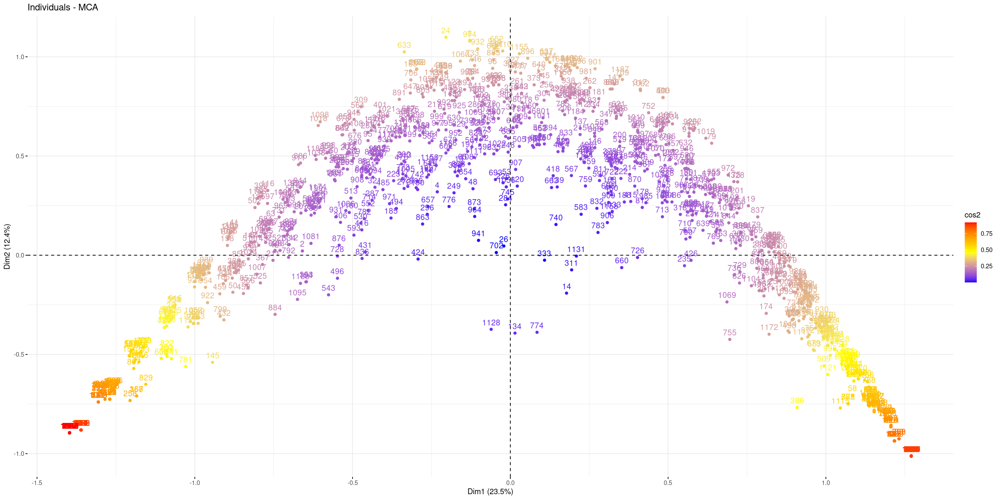

In [65]:
# Color by cos2 values: quality on the individual map
fviz_mca_ind(res.mca, col.ind = "cos2",
             gradient.cols = c("blue", "yellow", "red"))


in blue bad represented, in red well representef by the dimension£££

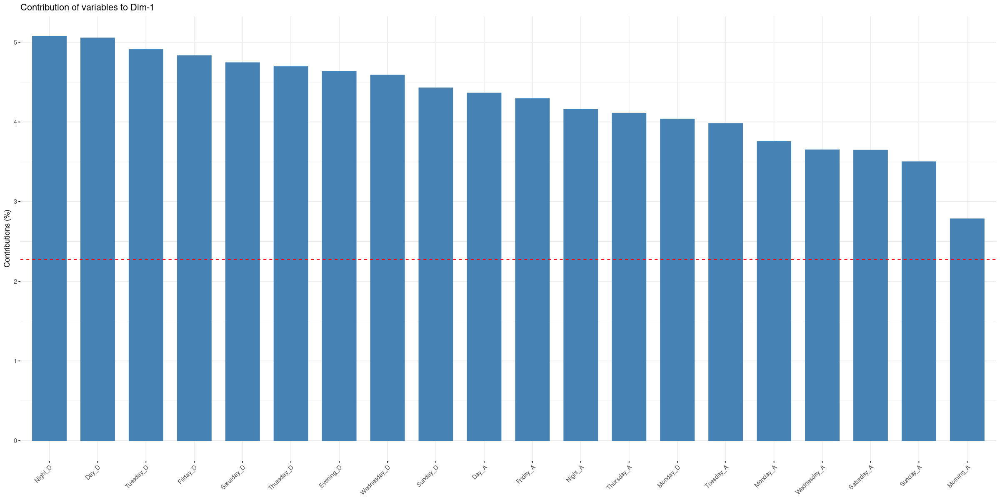

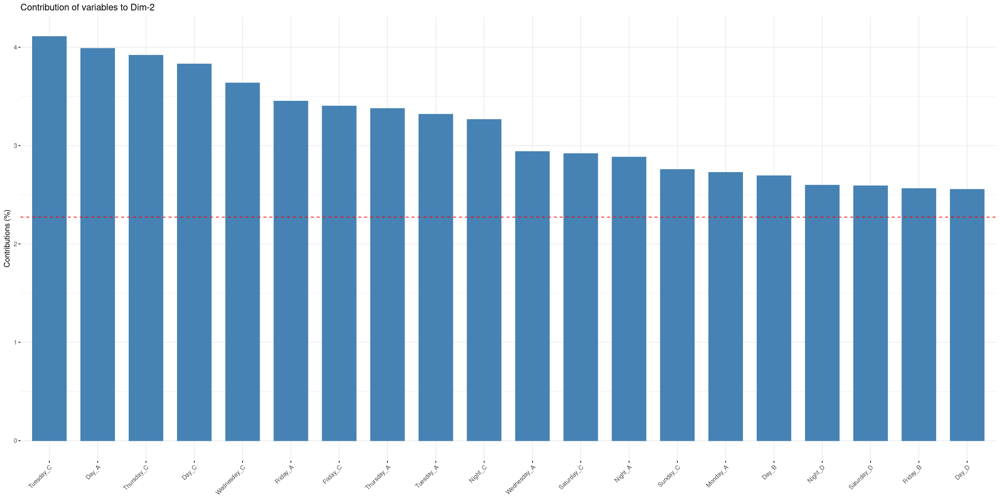

In [66]:

fviz_contrib(res.mca, choice="var", axes=1, top=20)

fviz_contrib(res.mca, choice="var", axes=2, top=20)

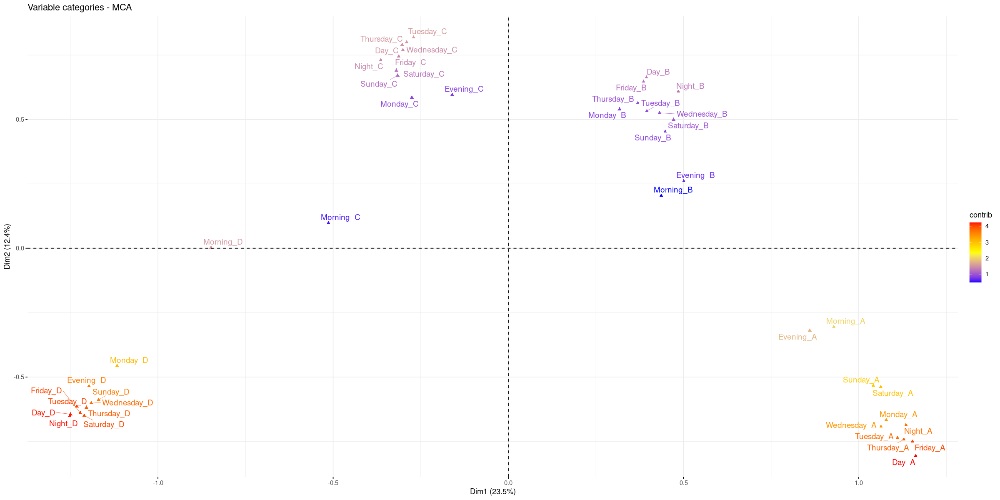

In [67]:
fviz_mca_var(res.mca, col.var = "contrib",
             gradient.cols = c("blue", "yellow", "red"), 
             repel = TRUE)

## Only days
regrouper morning et day, et evening et night

In [68]:
# Dividing day into four categories: 
#   0  - 6 + 19 - 23: Night + Evening = NE
#   7 - 18: Day = D

loadMCA3 <- load
d =1
weekNED <- c("MondayNE","MondayD", "TuesdayNE", "TuesdayD","WednesdayNE", "WednesdayD", "ThursdayNE", "ThursdayD", "FridayNE", "FridayD", "SaturdayNE", "SaturdayD", "SundayNE","SundayD")

for (i in seq(0, dim(load)[2]-1, by=24)){
    loadMCA3[, weekNED[d]] <- rowMeans(loadMCA3[, c(seq(i+1,7+i,by=1),seq(20+24,24+24,by=1))])
    loadMCA3[, weekNED[d+1]] <- rowMeans(loadMCA3[, seq(i + 8, i + 19, by=1)])/7
    d <- d + 2  
}



In [69]:
loadMCA3 <- loadMCA3[,169:182]



In [70]:
for (i in seq(1, dim(loadMCA3)[2])){
    q1 <- quantile(loadMCA3[,i],0.25,names=FALSE)
    q2 <- quantile(loadMCA3[,i],0.5,names=FALSE)
    q3 <- quantile(loadMCA3[,i],0.75,names=FALSE)
    loadMCA3[0<=loadMCA3[,i]&loadMCA3[,i]<q1,i] = 'A'
    loadMCA3[q1<=loadMCA3[,i]&loadMCA3[,i]<q2,i] = 'B'
    loadMCA3[q2<=loadMCA3[,i]&loadMCA3[,i]<q3,i] = 'C'
    loadMCA3[q3<=loadMCA3[,i]&loadMCA3[,i]<=1,i] = 'D'}


In [71]:
loadMCA3$Hill <- Hill

In [72]:
res2.mca = MCA(loadMCA3, graph=FALSE)
print(res2.mca)


**Results of the Multiple Correspondence Analysis (MCA)**
The analysis was performed on 1189 individuals, described by 15 variables
*The results are available in the following objects:

   name              description                       
1  "$eig"            "eigenvalues"                     
2  "$var"            "results for the variables"       
3  "$var$coord"      "coord. of the categories"        
4  "$var$cos2"       "cos2 for the categories"         
5  "$var$contrib"    "contributions of the categories" 
6  "$var$v.test"     "v-test for the categories"       
7  "$var$eta2"       "coord. of variables"             
8  "$ind"            "results for the individuals"     
9  "$ind$coord"      "coord. for the individuals"      
10 "$ind$cos2"       "cos2 for the individuals"        
11 "$ind$contrib"    "contributions of the individuals"
12 "$call"           "intermediate results"            
13 "$call$marge.col" "weights of columns"              
14 "$call$marge.li"  "weights 

,eigenvalue,percentage of variance,cumulative percentage of variance
dim 1,0.5248375,18.308286,18.30829
dim 2,0.2830211,9.872830,28.18112
dim 3,0.2378096,8.295685,36.47680
dim 4,0.1571578,5.482247,41.95905
dim 5,0.1429459,4.986484,46.94553
dim 6,0.1205083,4.203777,51.14931


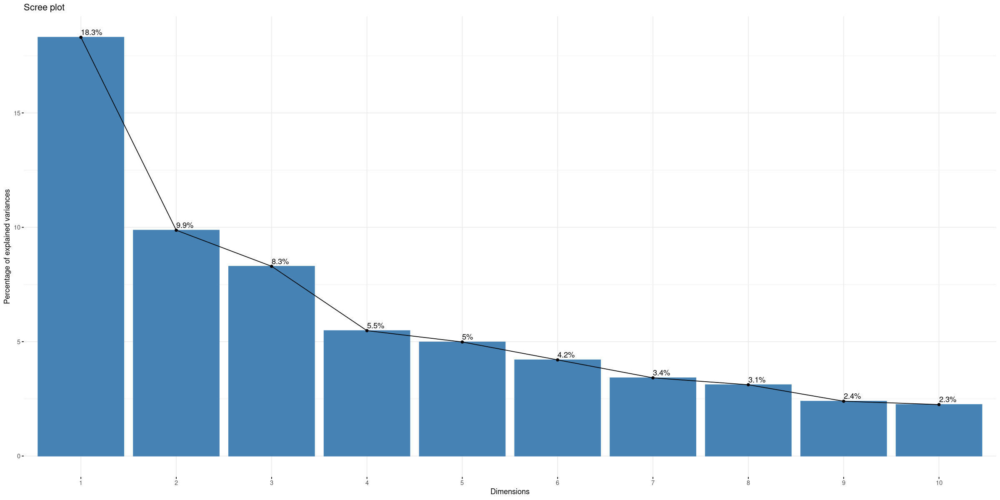

In [73]:
head(res2.mca$eig)

fviz_screeplot(res2.mca, addlabels=TRUE)

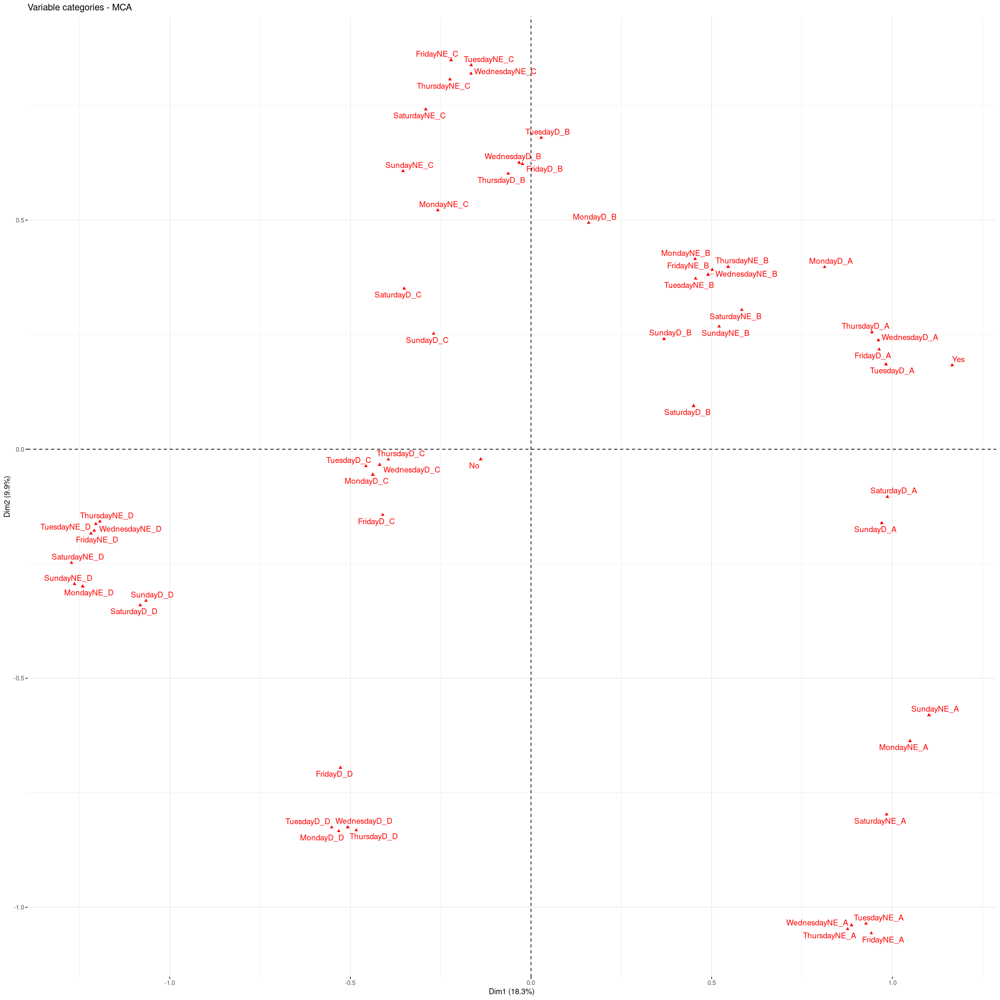

In [74]:
options(repr.plot.width = 20, repr.plot.height =20)
fviz_mca_var(res2.mca,repel = TRUE)

first dim : D loading on the left and A on the right: describe the loading of the stations more or less, to the left it's fuller, if it's on a hill (yes) then it's empty
second dim: ?


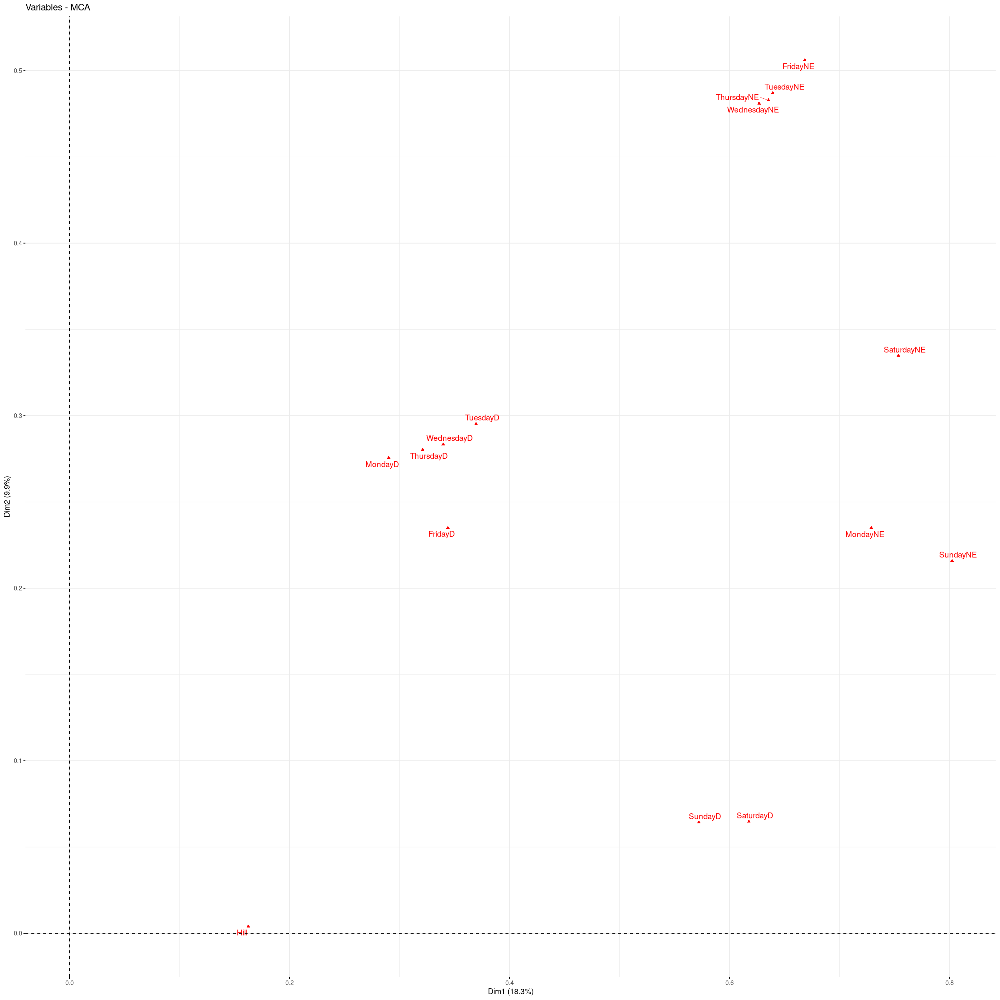

In [76]:
fviz_mca_var(res2.mca, choice="mca.cor", repel=TRUE)

day one side, evening and night on an other side, the week end is somewhere else

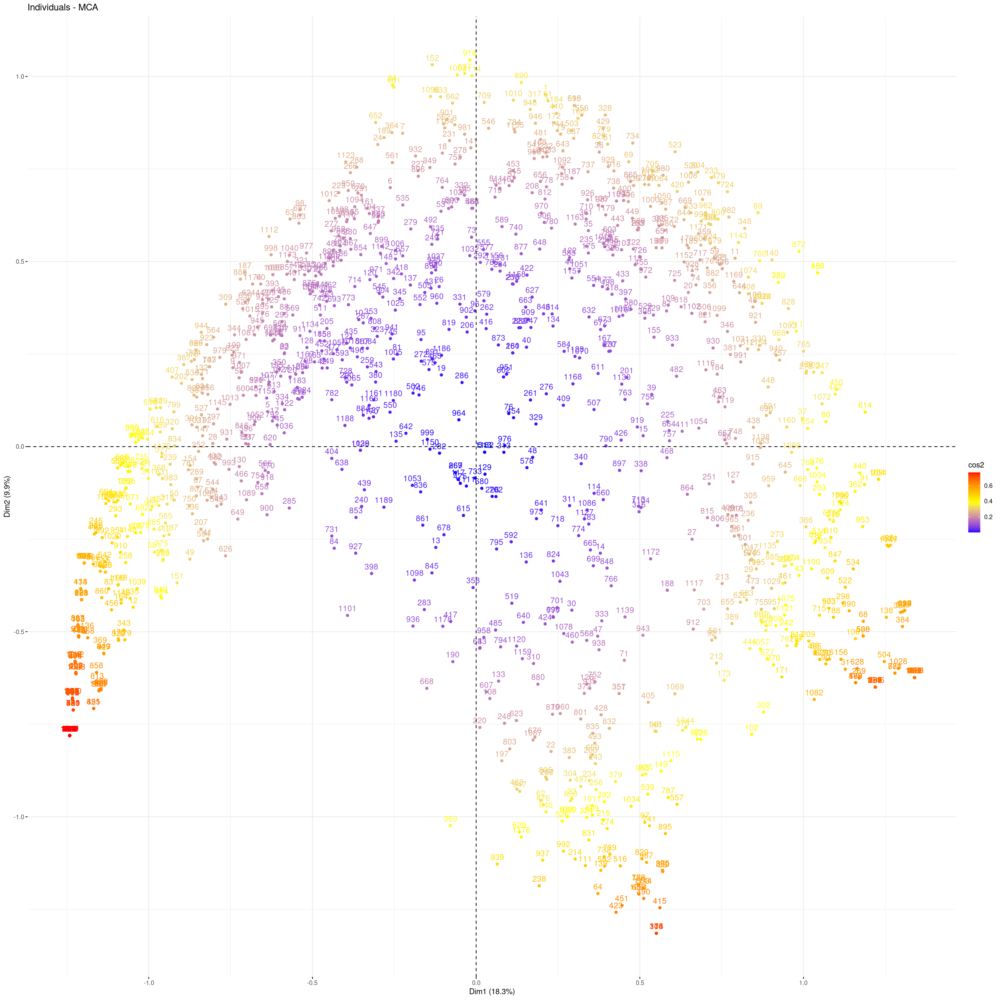

In [78]:
fviz_mca_ind(res2.mca, col.ind = "cos2",
             gradient.cols = c("blue", "yellow", "red"))

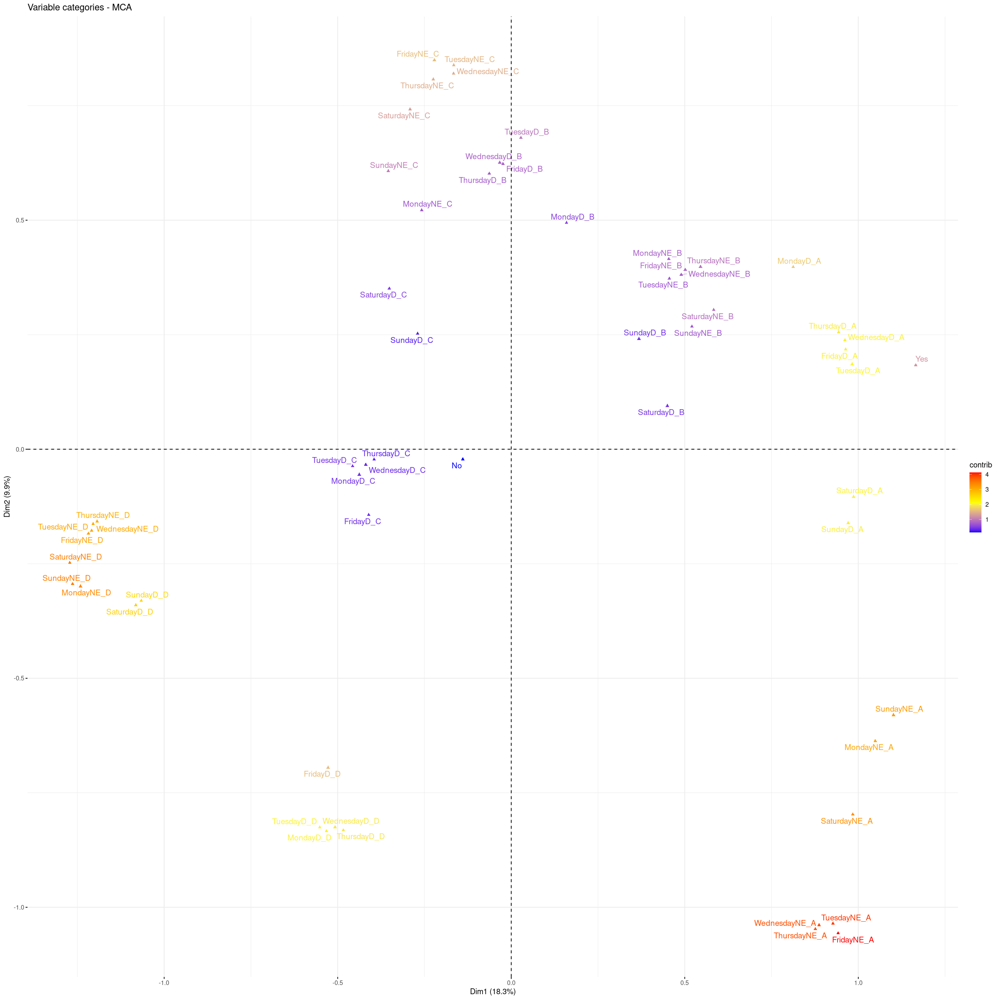

In [80]:
fviz_mca_var(res2.mca, col.var = "contrib",
             gradient.cols = c("blue", "yellow", "red"), 
             repel = TRUE)

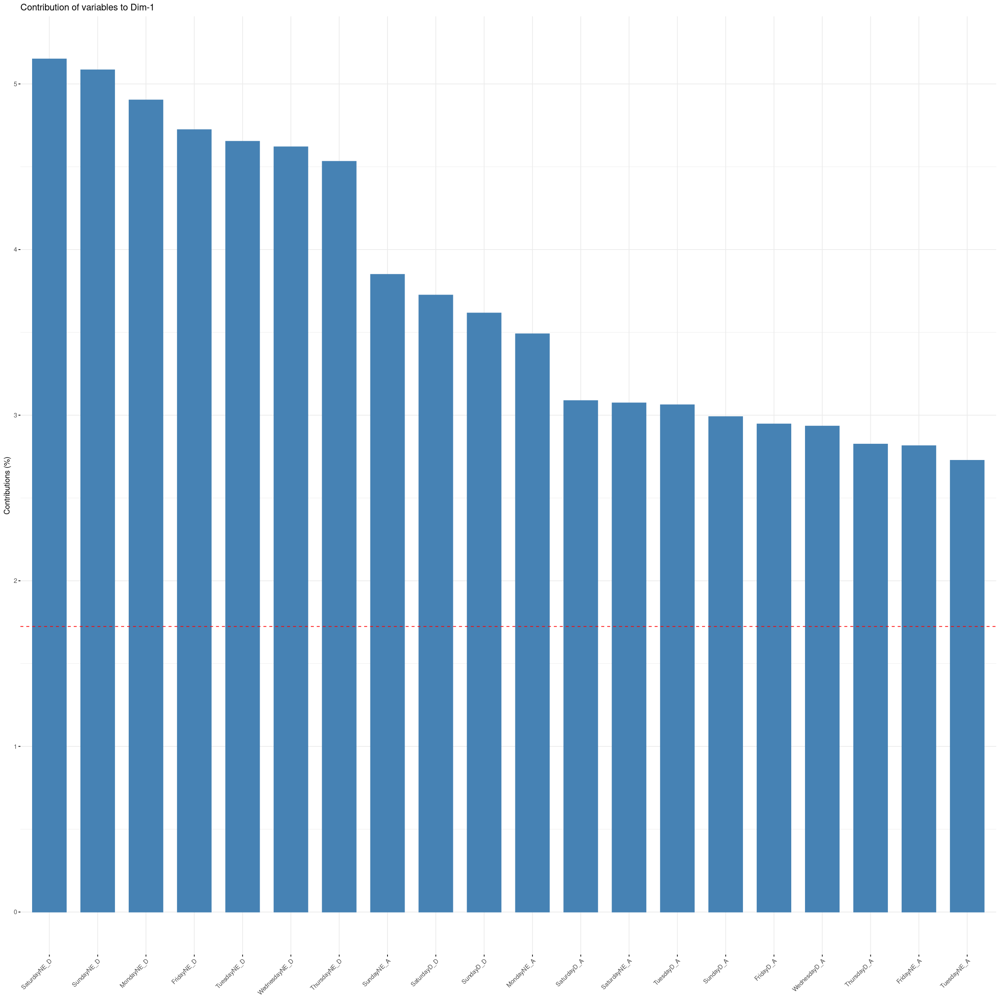

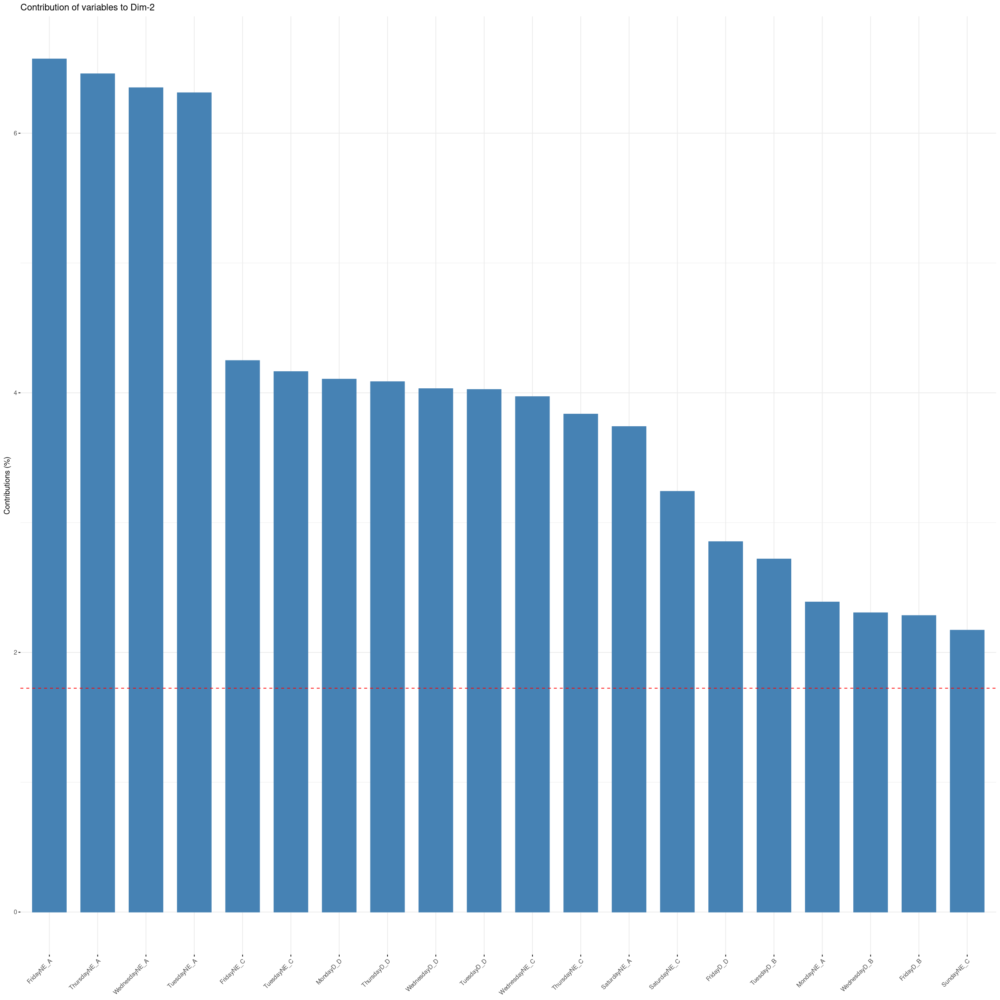

In [82]:

fviz_contrib(res2.mca, choice="var", axes=1, top=20)

fviz_contrib(res2.mca, choice="var", axes=2, top=20)